<a href="https://colab.research.google.com/github/AlvaroPorcel/Dog_Segmentation/blob/main/training_dog_segmentation_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Before you start

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`.

In [ ]:
!nvidia-smi

Mon Jul 29 15:19:10 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   44C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/content


In [ ]:


!pip install ultralytics==8.0.196

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 29.7/78.2 GB disk)


In [ ]:
from ultralytics import YOLO

from IPython.display import display, Image

In [ ]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets

!pip install roboflow --quiet

!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="tpigfEkN1Y8OPlbP8Vz2")
project = rf.workspace("dog-segmentation").project("dog-segmentation-3jadl")
version = project.version(1)
dataset = version.download("yolov8")



/content/datasets
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.9/76.9 kB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 12.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 5.2 MB/s eta 0:00:00
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Dog-Segmentation-1 in yolov8:: 100%|██████████| 2446/2446 [00:00<00:00, 4941.85it/s]


## Custom Training

In [ ]:
%cd {HOME}

!yolo task=segment mode=train model=yolov8s-seg.pt data=/content/datasets/Dog-Segmentation-1/data.yaml epochs=10 imgsz=640

/content
100% 22.8M/22.8M [00:00<00:00, 142MB/s]
New https://pypi.org/project/ultralytics/8.2.68 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=segment, mode=train, model=yolov8s-seg.pt, data=/content/datasets/Dog-Segmentation-1/data.yaml, epochs=10, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1,

In [ ]:
!ls {HOME}/runs/segment/train/

args.yaml					    labels.jpg	      train_batch2.jpg
BoxF1_curve.png					    MaskF1_curve.png  val_batch0_labels.jpg
BoxP_curve.png					    MaskP_curve.png   val_batch0_pred.jpg
BoxPR_curve.png					    MaskPR_curve.png  val_batch1_labels.jpg
BoxR_curve.png					    MaskR_curve.png   val_batch1_pred.jpg
confusion_matrix_normalized.png			    results.csv       val_batch2_labels.jpg
confusion_matrix.png				    results.png       val_batch2_pred.jpg
events.out.tfevents.1722266474.f9a712013b78.4440.0  train_batch0.jpg  weights
labels_correlogram.jpg				    train_batch1.jpg


In [ ]:
from IPython.display import Image

/content


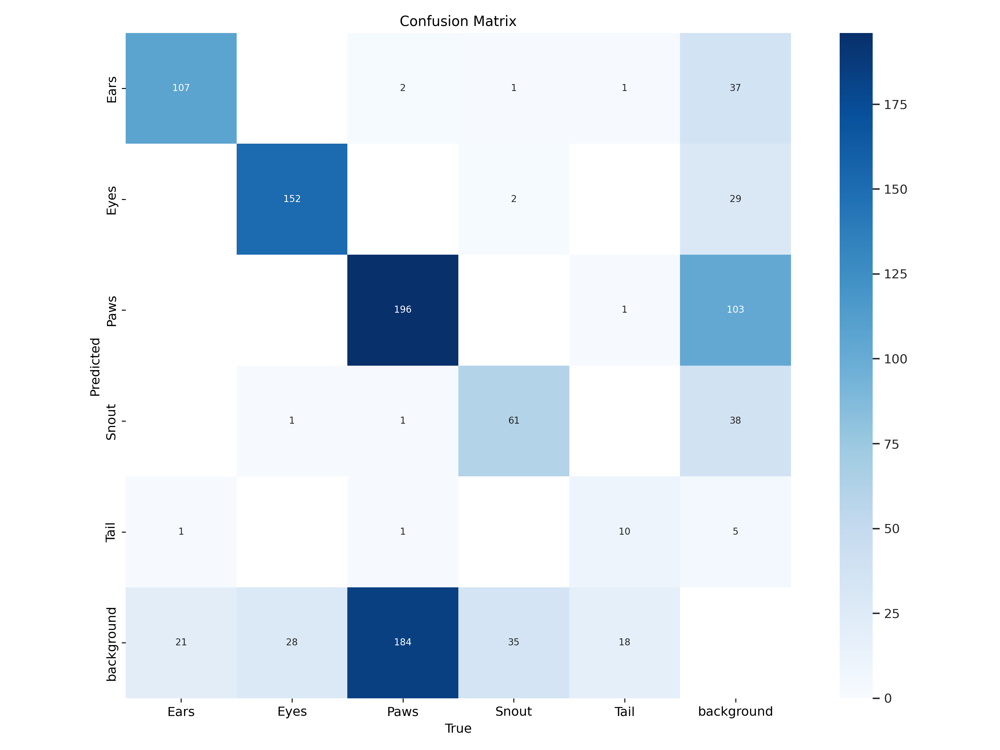

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/segment/train/confusion_matrix.png', width=600)

/content


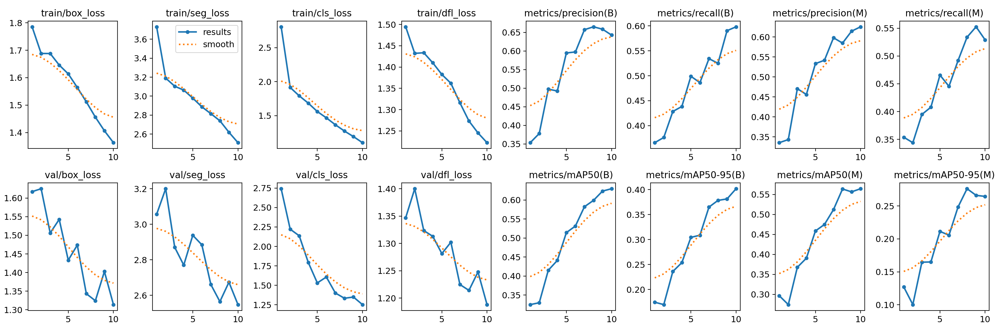

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/segment/train/results.png', width=600)

/content


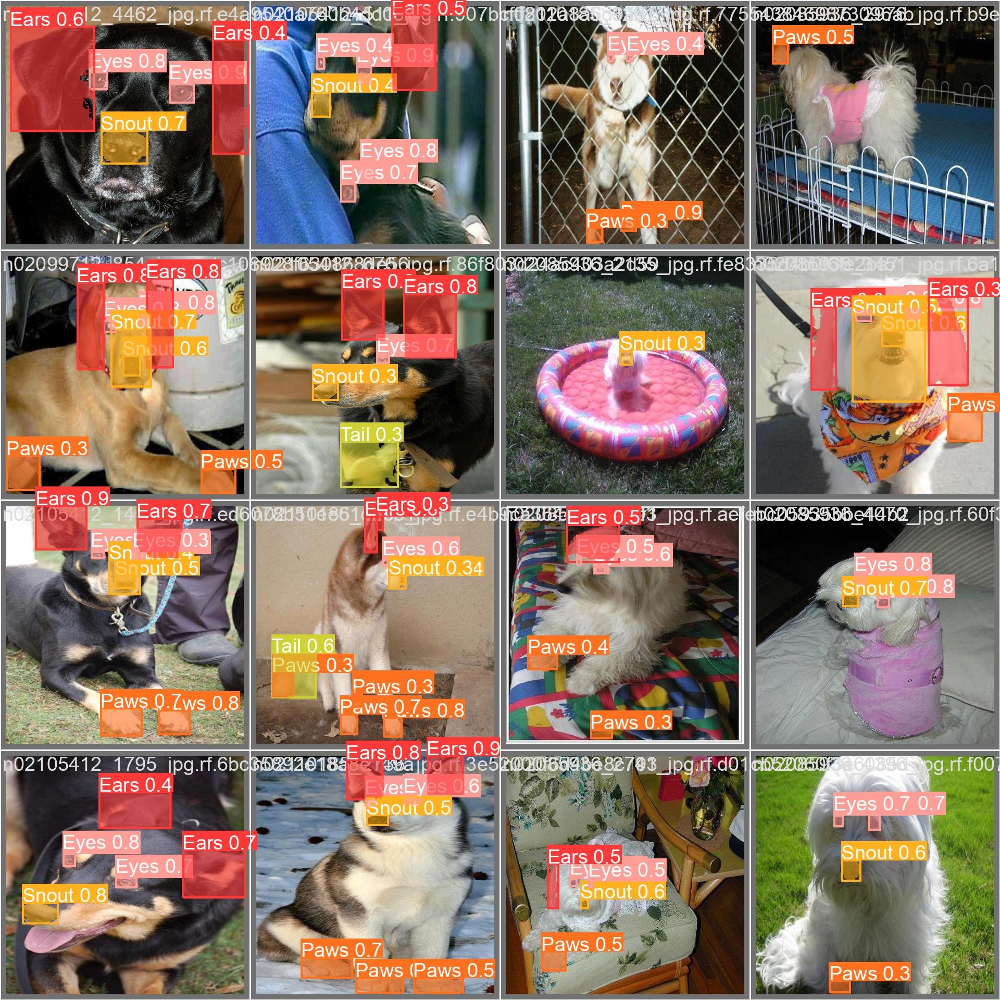

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/segment/train/val_batch0_pred.jpg', width=600)

## Validate Custom Model

In [ ]:
%cd {HOME}

!yolo task=segment mode=val model={HOME}/runs/segment/train/weights/best.pt data={dataset.location}/data.yaml

/content
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8s-seg summary (fused): 195 layers, 11781535 parameters, 0 gradients, 42.4 GFLOPs
val: Scanning /content/datasets/Dog-Segmentation-1/valid/labels.cache... 101 images, 0 backgrounds, 0 corrupt: 100% 101/101 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% 7/7 [00:14<00:00,  2.09s/it]
                   all        101        823      0.643      0.597      0.629      0.402      0.623      0.527      0.561      0.261
                  Ears        101        129      0.724      0.829      0.848      0.581      0.695       0.76      0.762      0.315
                  Eyes        101        181      0.839      0.833      0.864      0.547      0.803      0.768      0.801      0.377
                  Paws        101        384      0.654      0.497      0.554      0.324      0.618      0.4

## Inference with Custom Model

In [ ]:
%cd {HOME}
!yolo task=segment mode=predict model={HOME}/runs/segment/train/weights/best.pt conf=0.25 source={dataset.location}/test/images save=true

/content
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8s-seg summary (fused): 195 layers, 11781535 parameters, 0 gradients, 42.4 GFLOPs

image 1/51 /content/datasets/Dog-Segmentation-1/test/images/n02085936_137_jpg.rf.ba78a6198977d2af276f11373898bc50.jpg: 640x640 3 Eyess, 1 Snout, 20.9ms
image 2/51 /content/datasets/Dog-Segmentation-1/test/images/n02085936_1390_jpg.rf.a6d67b7f856f1d8b2d879e18e2cacc74.jpg: 640x640 2 Earss, 2 Eyess, 1 Paws, 1 Snout, 1 Tail, 20.9ms
image 3/51 /content/datasets/Dog-Segmentation-1/test/images/n02085936_2020_jpg.rf.c71a70007232df8dc1179209f4316f47.jpg: 640x640 5 Eyess, 15 Pawss, 1 Snout, 20.9ms
image 4/51 /content/datasets/Dog-Segmentation-1/test/images/n02085936_2154_jpg.rf.14f3a4ee4383ad35ec59ad639c766222.jpg: 640x640 2 Earss, 2 Eyess, 1 Paws, 1 Snout, 20.9ms
image 5/51 /content/datasets/Dog-Segmentation-1/test/images/n02085936_2422_jpg.rf.150f692b68bd7d0a8e263c45c9ec04e3.jpg: 640x640 4 Eyess, 1 Snout, 20.9ms

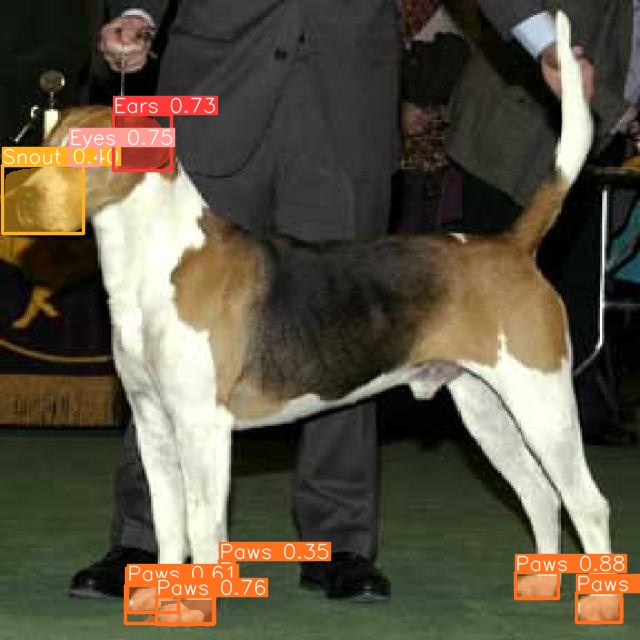

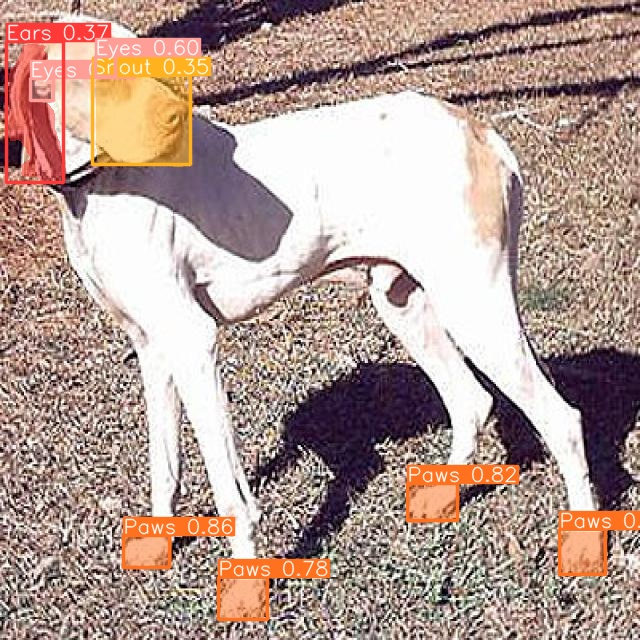

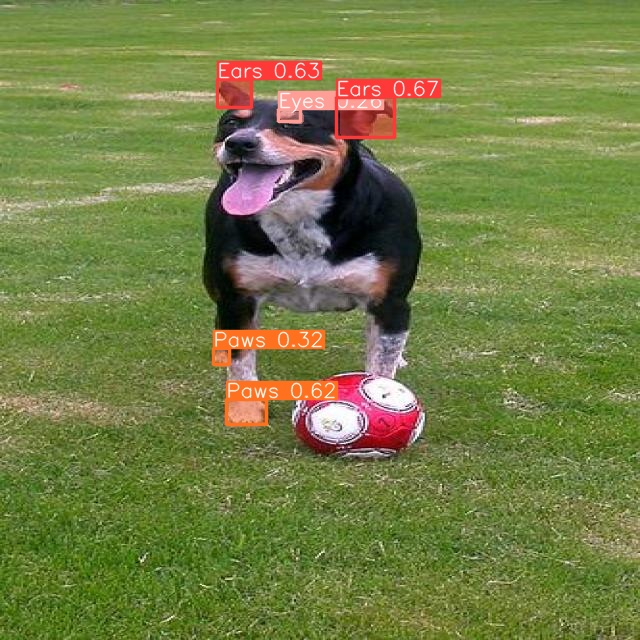

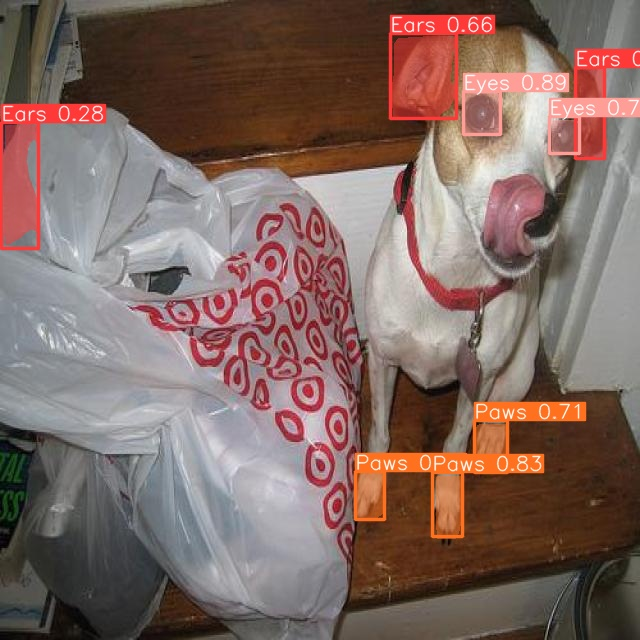

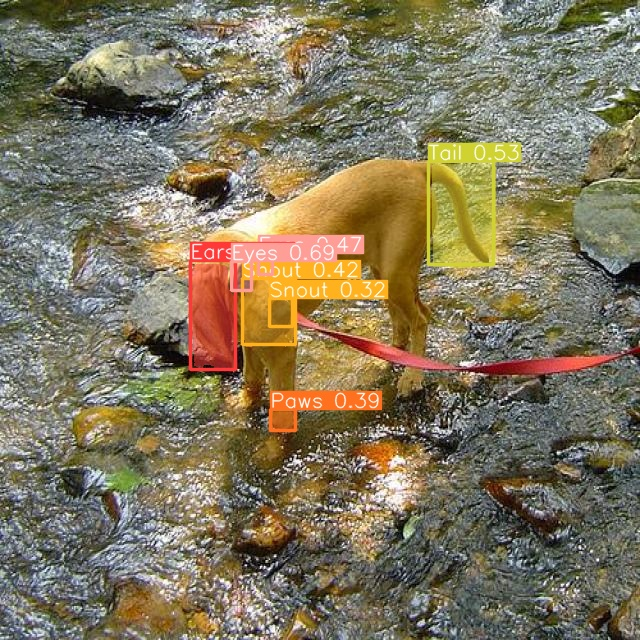

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/segment/predict/*.jpg')[15:20]:
      display(Image(filename=image_path, height=600))
      print("\n")

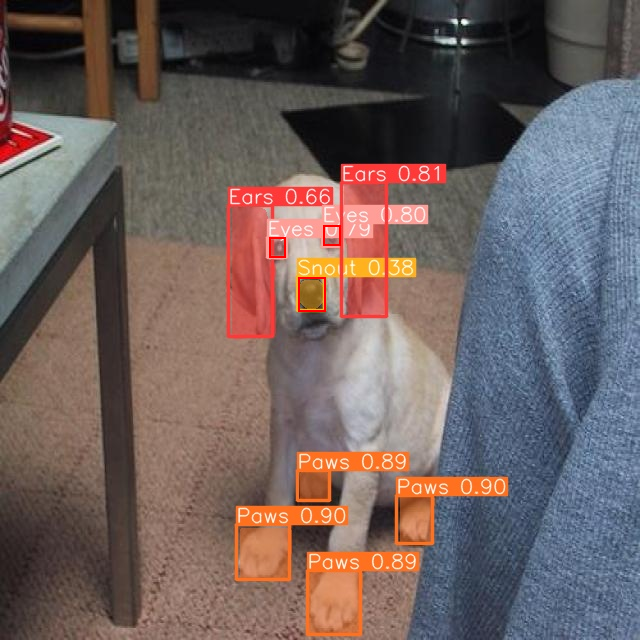

In [ ]:
# prompt: tengo archivo json de test y quiero que con esta imagen de test n02099712_607_jpg.rf.1eda4c10a321b48ef3b045e0224feab2.jpg, se dibuje las coordenadas de las boundary boxes, las boundary boxes de la imagen que arroja json es: [323,225,17.92,20.48], [269,237,16.64,20.48] y [298,277,27.5,34.167], las dos primeras coordenadas son los ojos y la otra restante la nariz

import json
from PIL import Image, ImageDraw

# Cargar la imagen
image_path = f'{HOME}/runs/segment/predict/n02099712_607_jpg.rf.1eda4c10a321b48ef3b045e0224feab2.jpg'
image = Image.open(image_path)

# Definir las coordenadas de las bounding boxes
bounding_boxes = [[323, 225, 17.92, 20.48], [269, 237, 16.64, 20.48], [298, 277, 27.5, 34.167]]

# Dibujar las bounding boxes en la imagen
draw = ImageDraw.Draw(image)
for box in bounding_boxes:
    x1, y1, w, h = box
    x2 = x1 + w
    y2 = y1 + h
    draw.rectangle([(x1, y1), (x2, y2)], outline='red', width=2)

# Mostrar la imagen con las bounding boxes dibujadas
display(image)


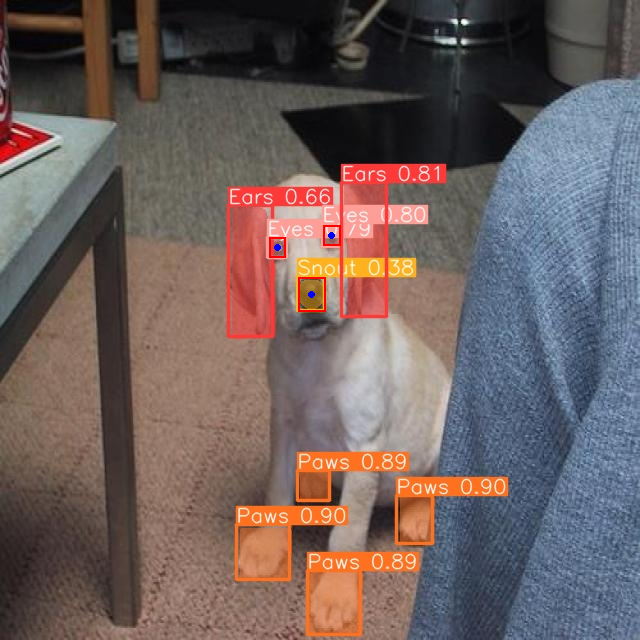

In [ ]:
import json
from PIL import Image, ImageDraw

# Cargar la imagen
image_path = f'{HOME}/runs/segment/predict/n02099712_607_jpg.rf.1eda4c10a321b48ef3b045e0224feab2.jpg'
image = Image.open(image_path)

# Definir las coordenadas de las bounding boxes
bounding_boxes = [[323, 225, 17.92, 20.48], [269, 237, 16.64, 20.48], [298, 277, 27.5, 34.167]]

# Crear un objeto para dibujar en la imagen
draw = ImageDraw.Draw(image)

# Dibujar las bounding boxes y los puntos azules en el centro
for box in bounding_boxes:
    x1, y1, w, h = box
    x2 = x1 + w
    y2 = y1 + h

    # Dibujar el rectángulo de la bounding box
    draw.rectangle([(x1, y1), (x2, y2)], outline='red', width=2)

    # Calcular el centro de la bounding box
    center_x = x1 + w / 2
    center_y = y1 + h / 2

    # Dibujar un punto azul en el centro
    draw.ellipse([(center_x - 3, center_y - 3), (center_x + 3, center_y + 3)], fill='blue', outline='blue')

# Mostrar la imagen con las bounding boxes y los puntos azules
display(image)


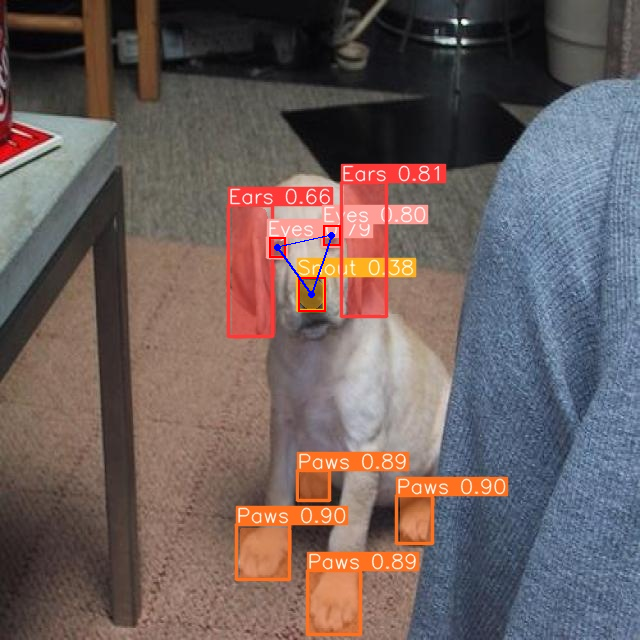

In [ ]:
import json
from PIL import Image, ImageDraw

# Cargar la imagen
image_path = f'{HOME}/runs/segment/predict/n02099712_607_jpg.rf.1eda4c10a321b48ef3b045e0224feab2.jpg'
image = Image.open(image_path)

# Definir las coordenadas de las bounding boxes
bounding_boxes = [[323, 225, 17.92, 20.48], [269, 237, 16.64, 20.48], [298, 277, 27.5, 34.167]]

# Crear un objeto para dibujar en la imagen
draw = ImageDraw.Draw(image)

# Lista para almacenar los puntos de los centros
centers = []

# Dibujar las bounding boxes y los puntos azules en el centro
for box in bounding_boxes:
    x1, y1, w, h = box
    x2 = x1 + w
    y2 = y1 + h

    # Dibujar el rectángulo de la bounding box
    draw.rectangle([(x1, y1), (x2, y2)], outline='red', width=2)

    # Calcular el centro de la bounding box
    center_x = x1 + w / 2
    center_y = y1 + h / 2

    # Almacenar el centro en la lista
    centers.append((center_x, center_y))

    # Dibujar un punto azul en el centro
    draw.ellipse([(center_x - 3, center_y - 3), (center_x + 3, center_y + 3)], fill='blue', outline='blue')

# Dibujar líneas para formar un triángulo conectando los puntos azules
for i in range(len(centers)):
    for j in range(i + 1, len(centers)):
        draw.line([centers[i], centers[j]], fill='blue', width=2)

# Mostrar la imagen con las bounding boxes, los puntos azules y el triángulo
display(image)




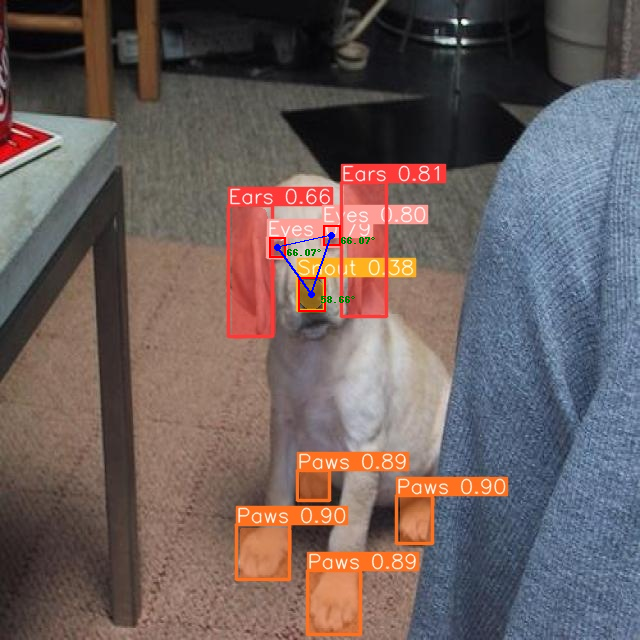

In [ ]:
import math
from PIL import Image, ImageDraw, ImageFont

# Cargar la imagen
image_path = f'{HOME}/runs/segment/predict/n02099712_607_jpg.rf.1eda4c10a321b48ef3b045e0224feab2.jpg'
image = Image.open(image_path)

# Definir las coordenadas de las bounding boxes
bounding_boxes = [[323, 225, 17.92, 20.48], [269, 237, 16.64, 20.48], [298, 277, 27.5, 34.167]]

# Crear un objeto para dibujar en la imagen
draw = ImageDraw.Draw(image)

# Lista para almacenar los puntos de los centros
centers = []

# Dibujar las bounding boxes y los puntos azules en el centro
for box in bounding_boxes:
    x1, y1, w, h = box
    x2 = x1 + w
    y2 = y1 + h

    # Dibujar el rectángulo de la bounding box
    draw.rectangle([(x1, y1), (x2, y2)], outline='red', width=2)

    # Calcular el centro de la bounding box
    center_x = x1 + w / 2
    center_y = y1 + h / 2

    # Almacenar el centro en la lista
    centers.append((center_x, center_y))

    # Dibujar un punto azul en el centro
    draw.ellipse([(center_x - 3, center_y - 3), (center_x + 3, center_y + 3)], fill='blue', outline='blue')

# Asegúrate de que tienes tres puntos y los ordenas: ojo izquierdo, ojo derecho, nariz
if len(centers) == 3:
    eye_left, eye_right, nose = centers

    # Dibujar líneas para formar un triángulo conectando los puntos azules
    draw.line([eye_left, eye_right], fill='blue', width=2)
    draw.line([eye_right, nose], fill='blue', width=2)
    draw.line([nose, eye_left], fill='blue', width=2)

    # Calcular ángulos en cada vértice del triángulo
    def angle_between(p1, p2, p3):
        """ Calcula el ángulo en grados en p2 dado p1 y p3 """
        a = math.sqrt((p1[0] - p2[0])**2 + (p1[1] - p2[1])**2)  # Distancia entre p1 y p2
        b = math.sqrt((p3[0] - p2[0])**2 + (p3[1] - p2[1])**2)  # Distancia entre p3 y p2
        c = math.sqrt((p1[0] - p3[0])**2 + (p1[1] - p3[1])**2)  # Distancia entre p1 y p3
        # Usar la ley de cosenos para calcular el ángulo
        angle = math.acos((a**2 + b**2 - c**2) / (2 * a * b))
        return math.degrees(angle)

    # Calcular los ángulos
    angle_eye_left = angle_between(eye_right, eye_left, nose)
    angle_eye_right = angle_between(eye_left, eye_right, nose)
    angle_nose = angle_between(eye_left, eye_right, nose)

    # Dibujar los ángulos en la imagen
    font = ImageFont.load_default()  # Usa una fuente predeterminada
    draw.text((eye_left[0] + 10, eye_left[1]), f'{angle_nose:.2f}°', fill='green', font=font)
    draw.text((eye_right[0] + 10, eye_right[1]), f'{angle_eye_right:.2f}°', fill='green', font=font)
    draw.text((nose[0] + 10, nose[1]), f'{angle_eye_left:.2f}°', fill='green', font=font)

# Mostrar la imagen con las bounding boxes, los puntos azules, el triángulo y los ángulos
display(image)



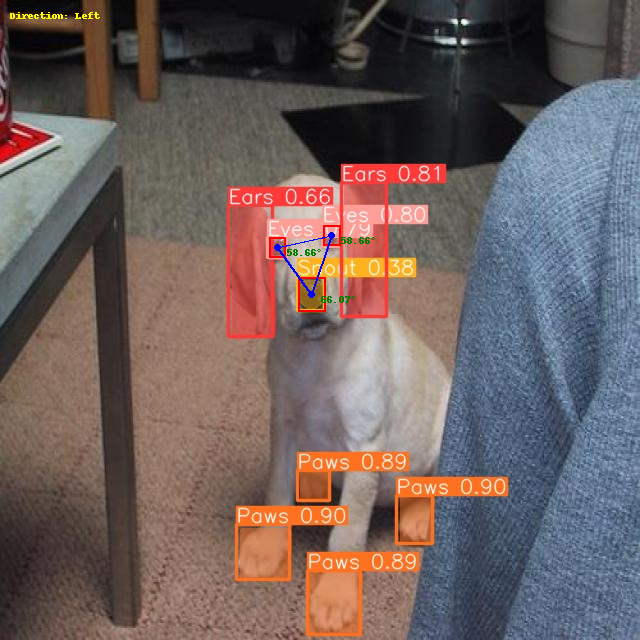

In [ ]:
import math
from PIL import Image, ImageDraw, ImageFont

# Cargar la imagen
image_path = f'{HOME}/runs/segment/predict/n02099712_607_jpg.rf.1eda4c10a321b48ef3b045e0224feab2.jpg'
image = Image.open(image_path)

# Definir las coordenadas de las bounding boxes
bounding_boxes = [[269, 237, 16.64, 20.48], [323, 225, 17.92, 20.48] , [298, 277, 27.5, 34.167]]

# Crear un objeto para dibujar en la imagen
draw = ImageDraw.Draw(image)

# Lista para almacenar los puntos de los centros
centers = []

# Dibujar las bounding boxes y los puntos azules en el centro
for box in bounding_boxes:
    x1, y1, w, h = box
    x2 = x1 + w
    y2 = y1 + h

    # Dibujar el rectángulo de la bounding box
    draw.rectangle([(x1, y1), (x2, y2)], outline='red', width=2)

    # Calcular el centro de la bounding box
    center_x = x1 + w / 2
    center_y = y1 + h / 2

    # Almacenar el centro en la lista
    centers.append((center_x, center_y))

    # Dibujar un punto azul en el centro
    draw.ellipse([(center_x - 3, center_y - 3), (center_x + 3, center_y + 3)], fill='blue', outline='blue')

# Asegúrate de que tienes tres puntos y los ordenas: ojo izquierdo, ojo derecho, nariz
if len(centers) == 3:
    eye_left, eye_right, nose = centers

    # Dibujar líneas para formar un triángulo conectando los puntos azules
    draw.line([eye_left, eye_right], fill='blue', width=2)
    draw.line([eye_right, nose], fill='blue', width=2)
    draw.line([nose, eye_left], fill='blue', width=2)

    # Calcular ángulos en cada vértice del triángulo
    def angle_between(p1, p2, p3):
        """ Calcula el ángulo en grados en p2 dado p1 y p3 """
        a = math.sqrt((p1[0] - p2[0])**2 + (p1[1] - p2[1])**2)  # Distancia entre p1 y p2
        b = math.sqrt((p3[0] - p2[0])**2 + (p3[1] - p2[1])**2)  # Distancia entre p3 y p2
        c = math.sqrt((p1[0] - p3[0])**2 + (p1[1] - p3[1])**2)  # Distancia entre p1 y p3
        # Usar la ley de cosenos para calcular el ángulo
        angle = math.acos((a**2 + b**2 - c**2) / (2 * a * b))
        return math.degrees(angle)

    # Calcular los ángulos
    angle_eye_left = angle_between(eye_right, eye_left, nose)
    angle_eye_right = angle_between(eye_left, eye_right, nose)
    angle_nose = angle_between(eye_left, eye_right, nose)

    # Mostrar los ángulos en la imagen
    font = ImageFont.load_default()  # Usa una fuente predeterminada
    draw.text((eye_left[0] + 10, eye_left[1]), f'{angle_nose:.2f}°', fill='green', font=font)
    draw.text((eye_right[0] + 10, eye_right[1]), f'{angle_eye_right:.2f}°', fill='green', font=font)
    draw.text((nose[0] + 10, nose[1]), f'{angle_eye_left:.2f}°', fill='green', font=font)

    # Definir umbrales para determinar la dirección
    threshold_left = 15   # Ángulo que define si el perro está mirando hacia la izquierda
    threshold_right = 15  # Ángulo que define si el perro está mirando hacia la derecha

    # Determinar la dirección basada en los ángulos
    if angle_eye_left < threshold_left and angle_eye_right < threshold_right:
        direction = 'Straight'
    elif angle_eye_left > angle_eye_right:
        direction = 'Left'
    else:
        direction = 'Right'

    # Mostrar la dirección en la imagen
    draw.text((10, 10), f'Direction: {direction}', fill='yellow', font=font)

# Mostrar la imagen con las bounding boxes, los puntos azules, el triángulo, los ángulos y la dirección
display(image)



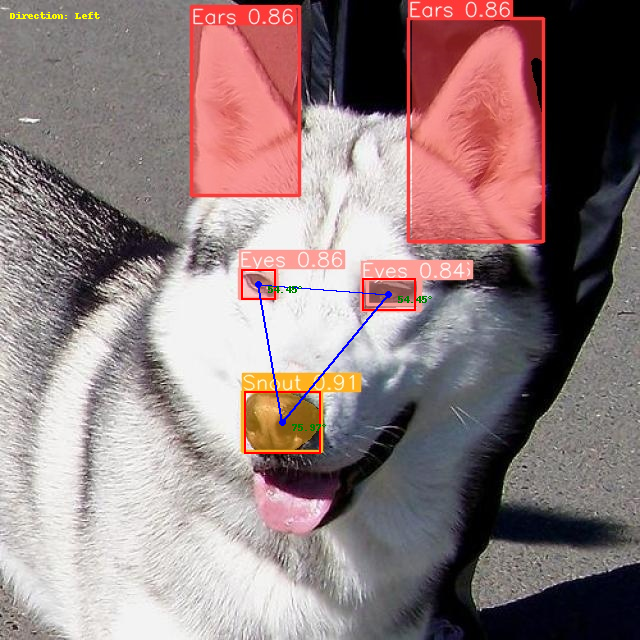

In [ ]:
#IMPERFECCIONES
import math
from PIL import Image, ImageDraw, ImageFont

# Cargar la imagen
image_path = f'{HOME}/runs/segment/predict/n02110185_3328_jpg.rf.3107ff38fa0f09dda42675a21e3e95fc.jpg'
image = Image.open(image_path)

# Definir las coordenadas de las bounding boxes
bounding_boxes = [[241,269,34.56,30.72], [362,278,53.76,32], [244,391,76.25,62.5]]

# Crear un objeto para dibujar en la imagen
draw = ImageDraw.Draw(image)

# Lista para almacenar los puntos de los centros
centers = []

# Dibujar las bounding boxes y los puntos azules en el centro
for box in bounding_boxes:
    x1, y1, w, h = box
    x2 = x1 + w
    y2 = y1 + h

    # Dibujar el rectángulo de la bounding box
    draw.rectangle([(x1, y1), (x2, y2)], outline='red', width=2)

    # Calcular el centro de la bounding box
    center_x = x1 + w / 2
    center_y = y1 + h / 2

    # Almacenar el centro en la lista
    centers.append((center_x, center_y))

    # Dibujar un punto azul en el centro
    draw.ellipse([(center_x - 3, center_y - 3), (center_x + 3, center_y + 3)], fill='blue', outline='blue')

# Asegúrate de que tienes tres puntos y los ordenas: ojo izquierdo, ojo derecho, nariz
if len(centers) == 3:
    eye_left, eye_right, nose = centers

    # Dibujar líneas para formar un triángulo conectando los puntos azules
    draw.line([eye_left, eye_right], fill='blue', width=2)
    draw.line([eye_right, nose], fill='blue', width=2)
    draw.line([nose, eye_left], fill='blue', width=2)

    # Calcular ángulos en cada vértice del triángulo
    def angle_between(p1, p2, p3):
        """ Calcula el ángulo en grados en p2 dado p1 y p3 """
        a = math.sqrt((p1[0] - p2[0])**2 + (p1[1] - p2[1])**2)  # Distancia entre p1 y p2
        b = math.sqrt((p3[0] - p2[0])**2 + (p3[1] - p2[1])**2)  # Distancia entre p3 y p2
        c = math.sqrt((p1[0] - p3[0])**2 + (p1[1] - p3[1])**2)  # Distancia entre p1 y p3
        # Usar la ley de cosenos para calcular el ángulo
        angle = math.acos((a**2 + b**2 - c**2) / (2 * a * b))
        return math.degrees(angle)

    # Calcular los ángulos
    angle_eye_left = angle_between(eye_right, eye_left, nose)
    angle_eye_right = angle_between(eye_left, eye_right, nose)
    angle_nose = angle_between(eye_left, eye_right, nose)

    # Mostrar los ángulos en la imagen
    font = ImageFont.load_default()  # Usa una fuente predeterminada
    draw.text((eye_left[0] + 10, eye_left[1]), f'{angle_nose:.2f}°', fill='green', font=font)
    draw.text((eye_right[0] + 10, eye_right[1]), f'{angle_eye_right:.2f}°', fill='green', font=font)
    draw.text((nose[0] + 10, nose[1]), f'{angle_eye_left:.2f}°', fill='green', font=font)

    # Definir umbrales para determinar la dirección
    threshold_left = 15   # Ángulo que define si el perro está mirando hacia la izquierda
    threshold_right = 15  # Ángulo que define si el perro está mirando hacia la derecha

    # Determinar la dirección basada en los ángulos
    if angle_eye_left < threshold_left and angle_eye_right < threshold_right:
        direction = 'Straight'
    elif angle_eye_left > angle_eye_right:
        direction = 'Left'
    else:
        direction = 'Right'

    # Mostrar la dirección en la imagen
    draw.text((10, 10), f'Direction: {direction}', fill='yellow', font=font)

# Mostrar la imagen con las bounding boxes, los puntos azules, el triángulo, los ángulos y la dirección
display(image)

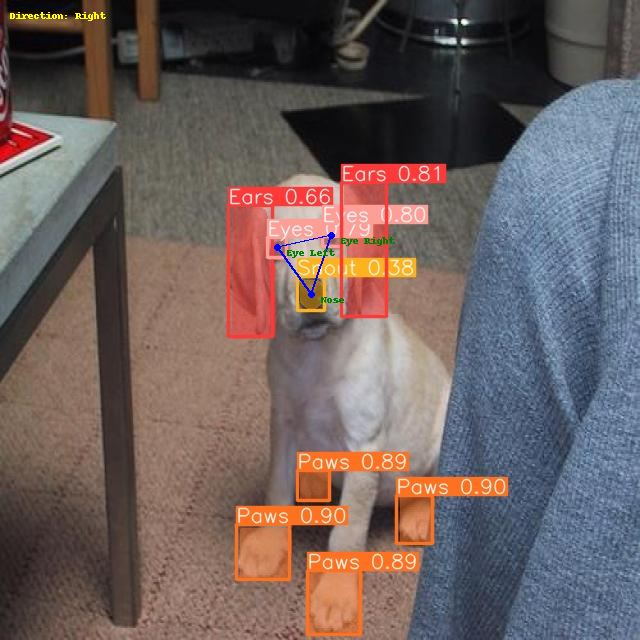

In [ ]:
#IMPERFECTO
from PIL import Image, ImageDraw, ImageFont

# Cargar la imagen
image_path = f'{HOME}/runs/segment/predict/n02099712_607_jpg.rf.1eda4c10a321b48ef3b045e0224feab2.jpg'
image = Image.open(image_path)

# Definir las coordenadas de las bounding boxes
# Primero: ojo derecho, Segundo: ojo izquierdo, Tercero: nariz
bounding_boxes = [[323, 225, 17.92, 20.48], [269, 237, 16.64, 20.48], [298, 277, 27.5, 34.167]]

# Crear un objeto para dibujar en la imagen
draw = ImageDraw.Draw(image)

# Lista para almacenar los puntos de los centros
centers = []

# Dibujar las bounding boxes y los puntos azules en el centro
for box in bounding_boxes:
    x1, y1, w, h = box
    x2 = x1 + w
    y2 = y1 + h

    # Calcular el centro de la bounding box
    center_x = x1 + w / 2
    center_y = y1 + h / 2

    # Almacenar el centro en la lista
    centers.append((center_x, center_y))

    # Dibujar un punto azul en el centro
    draw.ellipse([(center_x - 3, center_y - 3), (center_x + 3, center_y + 3)], fill='blue', outline='blue')

# Asegúrate de que tienes tres puntos: ojo derecho, ojo izquierdo, nariz
if len(centers) == 3:
    eye_right, eye_left, nose = centers

    # Dibujar líneas para formar un triángulo conectando los puntos azules
    draw.line([eye_right, eye_left], fill='blue', width=2)
    draw.line([eye_left, nose], fill='blue', width=2)
    draw.line([nose, eye_right], fill='blue', width=2)

    # Mostrar los ángulos en la imagen (opcional)
    font = ImageFont.load_default()  # Usa una fuente predeterminada
    draw.text((eye_right[0] + 10, eye_right[1]), f'Eye Right', fill='green', font=font)
    draw.text((eye_left[0] + 10, eye_left[1]), f'Eye Left', fill='green', font=font)
    draw.text((nose[0] + 10, nose[1]), f'Nose', fill='green', font=font)

    # Determinar la dirección basándose en la posición de la nariz respecto a los ojos
    # Calcular la media entre los dos ojos
    eye_mid_x = (eye_right[0] + eye_left[0]) / 2

    # Determinar la dirección basándose en la posición de la nariz
    if nose[0] > eye_mid_x:
        direction = 'Right'
    elif nose[0] < eye_mid_x:
        direction = 'Left'
    else:
        direction = 'Straight'

    # Mostrar la dirección en la imagen
    draw.text((10, 10), f'Direction: {direction}', fill='yellow', font=font)

# Mostrar la imagen con las bounding boxes, los puntos azules, el triángulo y la dirección
display(image)




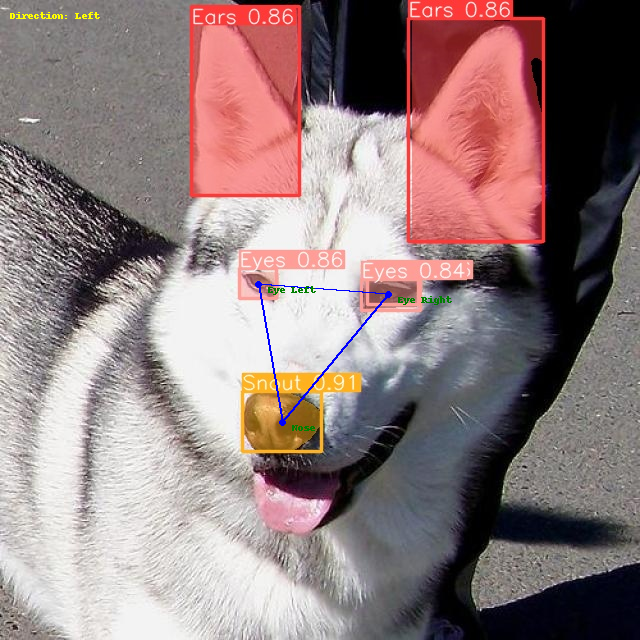

In [ ]:
#IMPERFECTO
from PIL import Image, ImageDraw, ImageFont

# Cargar la imagen
image_path = f'{HOME}/runs/segment/predict/n02110185_3328_jpg.rf.3107ff38fa0f09dda42675a21e3e95fc.jpg'
image = Image.open(image_path)

# Definir las coordenadas de las bounding boxes
# Primero: ojo derecho, Segundo: ojo izquierdo, Tercero: nariz
bounding_boxes = [[362,278,53.76,32], [241,269,34.56,30.72], [244,391,76.25,62.5]]

# Crear un objeto para dibujar en la imagen
draw = ImageDraw.Draw(image)

# Lista para almacenar los puntos de los centros
centers = []

# Dibujar las bounding boxes y los puntos azules en el centro
for box in bounding_boxes:
    x1, y1, w, h = box
    x2 = x1 + w
    y2 = y1 + h

    # Calcular el centro de la bounding box
    center_x = x1 + w / 2
    center_y = y1 + h / 2

    # Almacenar el centro en la lista
    centers.append((center_x, center_y))

    # Dibujar un punto azul en el centro
    draw.ellipse([(center_x - 3, center_y - 3), (center_x + 3, center_y + 3)], fill='blue', outline='blue')

# Asegúrate de que tienes tres puntos: ojo derecho, ojo izquierdo, nariz
if len(centers) == 3:
    eye_right, eye_left, nose = centers

    # Dibujar líneas para formar un triángulo conectando los puntos azules
    draw.line([eye_right, eye_left], fill='blue', width=2)
    draw.line([eye_left, nose], fill='blue', width=2)
    draw.line([nose, eye_right], fill='blue', width=2)

    # Mostrar los ángulos en la imagen (opcional)
    font = ImageFont.load_default()  # Usa una fuente predeterminada
    draw.text((eye_right[0] + 10, eye_right[1]), f'Eye Right', fill='green', font=font)
    draw.text((eye_left[0] + 10, eye_left[1]), f'Eye Left', fill='green', font=font)
    draw.text((nose[0] + 10, nose[1]), f'Nose', fill='green', font=font)

    # Determinar la dirección basándose en la posición de la nariz respecto a los ojos
    # Calcular la media entre los dos ojos
    eye_mid_x = (eye_right[0] + eye_left[0]) / 2

    # Determinar la dirección basándose en la posición de la nariz
    if nose[0] > eye_mid_x:
        direction = 'Right'
    elif nose[0] < eye_mid_x:
        direction = 'Left'
    else:
        direction = 'Straight'

    # Mostrar la dirección en la imagen
    draw.text((10, 10), f'Direction: {direction}', fill='yellow', font=font)

# Mostrar la imagen con las bounding boxes, los puntos azules, el triángulo y la dirección
display(image)

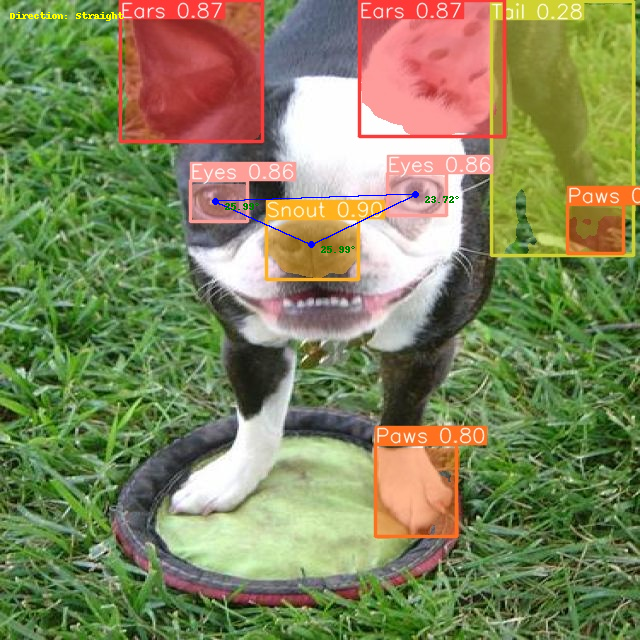

In [ ]:
#FINAL 1
import math
from PIL import Image, ImageDraw, ImageFont

# Cargar la imagen
image_path = f'{HOME}/runs/segment/predict/n02096585_2419_jpg.rf.3c856d049485a6f213f0b3f56ba9a8d9.jpg'
image = Image.open(image_path)

# Definir las coordenadas de las bounding boxes
# Primero: ojo derecho, Segundo: ojo izquierdo, Tercero: nariz
bounding_boxes = [[386,175,58.027,38.4], [189,182,52.907,38.4], [265,219,93.333,50]]

# Crear un objeto para dibujar en la imagen
draw = ImageDraw.Draw(image)

# Lista para almacenar los puntos de los centros
centers = []

# Dibujar las bounding boxes y los puntos azules en el centro
for box in bounding_boxes:
    x1, y1, w, h = box
    x2 = x1 + w
    y2 = y1 + h

    # Calcular el centro de la bounding box
    center_x = x1 + w / 2
    center_y = y1 + h / 2

    # Almacenar el centro en la lista
    centers.append((center_x, center_y))

    # Dibujar un punto azul en el centro
    draw.ellipse([(center_x - 3, center_y - 3), (center_x + 3, center_y + 3)], fill='blue', outline='blue')

# Asegúrate de que tienes tres puntos: ojo derecho, ojo izquierdo, nariz
if len(centers) == 3:
    eye_right, eye_left, nose = centers

    # Dibujar líneas para formar un triángulo conectando los puntos azules
    draw.line([eye_right, eye_left], fill='blue', width=2)
    draw.line([eye_left, nose], fill='blue', width=2)
    draw.line([nose, eye_right], fill='blue', width=2)

    # Calcular los ángulos en cada vértice del triángulo
    def angle_between(p1, p2, p3):
        """ Calcula el ángulo en grados en p2 dado p1 y p3 """
        a = math.sqrt((p1[0] - p2[0])**2 + (p1[1] - p2[1])**2)  # Distancia entre p1 y p2
        b = math.sqrt((p3[0] - p2[0])**2 + (p3[1] - p2[1])**2)  # Distancia entre p3 y p2
        c = math.sqrt((p1[0] - p3[0])**2 + (p1[1] - p3[1])**2)  # Distancia entre p1 y p3
        # Usar la ley de cosenos para calcular el ángulo
        angle = math.acos((a**2 + b**2 - c**2) / (2 * a * b))
        return math.degrees(angle)

    # Calcular los ángulos
    angle_eye_right = angle_between(eye_left, eye_right, nose)
    angle_eye_left = angle_between(eye_right, eye_left, nose)
    angle_nose = angle_between(eye_right, eye_left, nose)

    # Mostrar los ángulos en la imagen
    font = ImageFont.load_default()  # Usa una fuente predeterminada
    draw.text((eye_right[0] + 10, eye_right[1]), f'{angle_eye_right:.2f}°', fill='green', font=font)
    draw.text((eye_left[0] + 10, eye_left[1]), f'{angle_eye_left:.2f}°', fill='green', font=font)
    draw.text((nose[0] + 10, nose[1]), f'{angle_nose:.2f}°', fill='green', font=font)

    # Determinar la dirección basándose en la posición de la nariz respecto a los ojos
    # Calcular la distancia de la nariz a cada ojo
    distance_to_eye_right = abs(nose[0] - eye_right[0])
    distance_to_eye_left = abs(nose[0] - eye_left[0])

    # Calcular la media entre los dos ojos
    eye_mid_x = (eye_right[0] + eye_left[0]) / 2
    eye_distance = abs(eye_right[0] - eye_left[0])

    # Definir un umbral para considerar si la nariz está mirando al frente
    threshold = 0.2 * eye_distance  # 20% de la distancia entre los ojos

    # Determinar la dirección basándose en la posición de la nariz
    if abs(nose[0] - eye_mid_x) < threshold:
        direction = 'Straight'
    elif distance_to_eye_right < distance_to_eye_left:
        direction = 'Right'
    elif distance_to_eye_left < distance_to_eye_right:
        direction = 'Left'
    else:
        direction = 'Straight'

    # Mostrar la dirección en la imagen
    draw.text((10, 10), f'Direction: {direction}', fill='yellow', font=font)

# Mostrar la imagen con las bounding boxes, los puntos azules, el triángulo, los ángulos y la dirección
display(image)


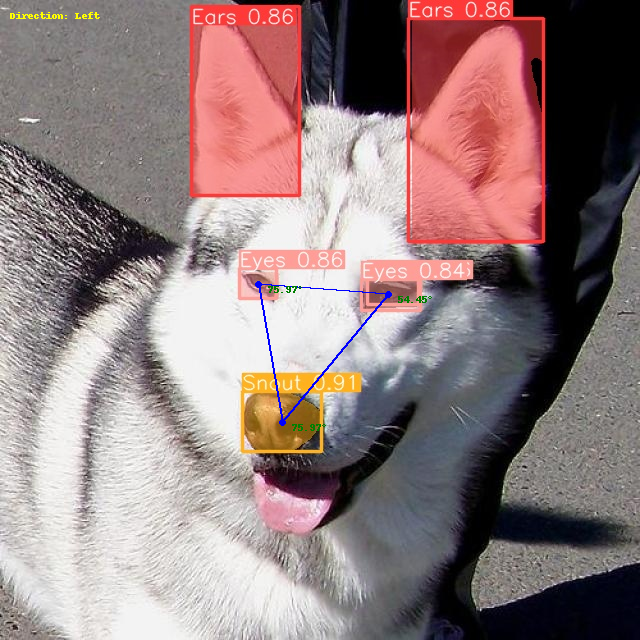

In [ ]:
#FINAL 2
import math
from PIL import Image, ImageDraw, ImageFont

# Cargar la imagen
image_path = f'{HOME}/runs/segment/predict/n02110185_3328_jpg.rf.3107ff38fa0f09dda42675a21e3e95fc.jpg'
image = Image.open(image_path)

# Definir las coordenadas de las bounding boxes
# Primero: ojo derecho, Segundo: ojo izquierdo, Tercero: nariz
bounding_boxes = [[362,278,53.76,32], [241,269,34.56,30.72], [244,391,76.25,62.5]]

# Crear un objeto para dibujar en la imagen
draw = ImageDraw.Draw(image)

# Lista para almacenar los puntos de los centros
centers = []

# Dibujar las bounding boxes y los puntos azules en el centro
for box in bounding_boxes:
    x1, y1, w, h = box
    x2 = x1 + w
    y2 = y1 + h

    # Calcular el centro de la bounding box
    center_x = x1 + w / 2
    center_y = y1 + h / 2

    # Almacenar el centro en la lista
    centers.append((center_x, center_y))

    # Dibujar un punto azul en el centro
    draw.ellipse([(center_x - 3, center_y - 3), (center_x + 3, center_y + 3)], fill='blue', outline='blue')

# Asegúrate de que tienes tres puntos: ojo derecho, ojo izquierdo, nariz
if len(centers) == 3:
    eye_right, eye_left, nose = centers

    # Dibujar líneas para formar un triángulo conectando los puntos azules
    draw.line([eye_right, eye_left], fill='blue', width=2)
    draw.line([eye_left, nose], fill='blue', width=2)
    draw.line([nose, eye_right], fill='blue', width=2)

    # Ángulos en cada vértice del triángulo
    def angle_between(p1, p2, p3):
        """ Calcula el ángulo en grados en p2 dado p1 y p3 """
        a = math.sqrt((p1[0] - p2[0])**2 + (p1[1] - p2[1])**2)  # Distancia entre p1 y p2
        b = math.sqrt((p3[0] - p2[0])**2 + (p3[1] - p2[1])**2)  # Distancia entre p3 y p2
        c = math.sqrt((p1[0] - p3[0])**2 + (p1[1] - p3[1])**2)  # Distancia entre p1 y p3
        #Ley de cosenos para calcular el ángulo
        angle = math.acos((a**2 + b**2 - c**2) / (2 * a * b))
        return math.degrees(angle)

    # Calcular los ángulos
    angle_eye_right = angle_between(eye_left, eye_right, nose)
    angle_eye_left = angle_between(eye_right, eye_left, nose)
    angle_nose = angle_between(eye_right, eye_left, nose)

    # Mostrar los ángulos en la imagen
    font = ImageFont.load_default()  # Usa una fuente predeterminada
    draw.text((eye_right[0] + 10, eye_right[1]), f'{angle_eye_right:.2f}°', fill='green', font=font)
    draw.text((eye_left[0] + 10, eye_left[1]), f'{angle_eye_left:.2f}°', fill='green', font=font)
    draw.text((nose[0] + 10, nose[1]), f'{angle_nose:.2f}°', fill='green', font=font)

    # Determinar la dirección basándose en la posición de la nariz respecto a los ojos
    # Calcular la distancia de la nariz a cada ojo
    distance_to_eye_right = abs(nose[0] - eye_right[0])
    distance_to_eye_left = abs(nose[0] - eye_left[0])

    # Calcular la media entre los dos ojos
    eye_mid_x = (eye_right[0] + eye_left[0]) / 2
    eye_distance = abs(eye_right[0] - eye_left[0])

    # Definir un umbral para considerar si la nariz está mirando al frente
    threshold = 0.2 * eye_distance  # 20% de la distancia entre los ojos

    # Determinar la dirección basándose en la posición de la nariz
    if abs(nose[0] - eye_mid_x) < threshold:
        direction = 'Straight'
    elif distance_to_eye_right < distance_to_eye_left:
        direction = 'Right'
    elif distance_to_eye_left < distance_to_eye_right:
        direction = 'Left'
    else:
        direction = 'Straight'

    # Mostrar la dirección en la imagen
    draw.text((10, 10), f'Direction: {direction}', fill='yellow', font=font)

# Mostrar la imagen con las bounding boxes, los puntos azules, el triángulo, los ángulos y la dirección
display(image)

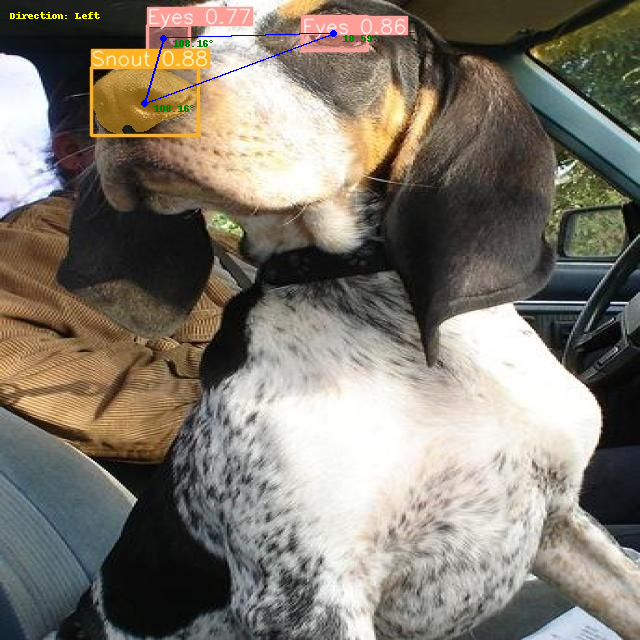

In [ ]:
#FINAL 2
import math
from PIL import Image, ImageDraw, ImageFont

# Cargar la imagen
image_path = f'{HOME}/runs/segment/predict/n02088632_2165_jpg.rf.b09c53feba9ace0f5c48bb04a24f471f.jpg'
image = Image.open(image_path)

# Definir las coordenadas de las bounding boxes
# Primero: ojo derecho, Segundo: ojo izquierdo, Tercero: nariz
bounding_boxes = [[300,18,66.977,30.72], [145,26,37.209,25.6], [91,69,107.195,69.375]]

# Crear un objeto para dibujar en la imagen
draw = ImageDraw.Draw(image)

# Lista para almacenar los puntos de los centros
centers = []

# Dibujar las bounding boxes y los puntos azules en el centro
for box in bounding_boxes:
    x1, y1, w, h = box
    x2 = x1 + w
    y2 = y1 + h

    # Calcular el centro de la bounding box
    center_x = x1 + w / 2
    center_y = y1 + h / 2

    # Almacenar el centro en la lista
    centers.append((center_x, center_y))

    # Dibujar un punto azul en el centro
    draw.ellipse([(center_x - 3, center_y - 3), (center_x + 3, center_y + 3)], fill='blue', outline='blue')

# Asegúrate de que tienes tres puntos: ojo derecho, ojo izquierdo, nariz
if len(centers) == 3:
    eye_right, eye_left, nose = centers

    # Dibujar líneas para formar un triángulo conectando los puntos azules
    draw.line([eye_right, eye_left], fill='blue', width=2)
    draw.line([eye_left, nose], fill='blue', width=2)
    draw.line([nose, eye_right], fill='blue', width=2)

    # Calcular los ángulos en cada vértice del triángulo
    def angle_between(p1, p2, p3):
        """ Calcula el ángulo en grados en p2 dado p1 y p3 """
        a = math.sqrt((p1[0] - p2[0])**2 + (p1[1] - p2[1])**2)  # Distancia entre p1 y p2
        b = math.sqrt((p3[0] - p2[0])**2 + (p3[1] - p2[1])**2)  # Distancia entre p3 y p2
        c = math.sqrt((p1[0] - p3[0])**2 + (p1[1] - p3[1])**2)  # Distancia entre p1 y p3
        # Usar la ley de cosenos para calcular el ángulo
        angle = math.acos((a**2 + b**2 - c**2) / (2 * a * b))
        return math.degrees(angle)

    # Calcular los ángulos
    angle_eye_right = angle_between(eye_left, eye_right, nose)
    angle_eye_left = angle_between(eye_right, eye_left, nose)
    angle_nose = angle_between(eye_right, eye_left, nose)

    # Mostrar los ángulos en la imagen
    font = ImageFont.load_default()  # Usa una fuente predeterminada
    draw.text((eye_right[0] + 10, eye_right[1]), f'{angle_eye_right:.2f}°', fill='green', font=font)
    draw.text((eye_left[0] + 10, eye_left[1]), f'{angle_eye_left:.2f}°', fill='green', font=font)
    draw.text((nose[0] + 10, nose[1]), f'{angle_nose:.2f}°', fill='green', font=font)

    # Determinar la dirección basándose en la posición de la nariz respecto a los ojos
    # Calcular la distancia de la nariz a cada ojo
    distance_to_eye_right = abs(nose[0] - eye_right[0])
    distance_to_eye_left = abs(nose[0] - eye_left[0])

    # Calcular la media entre los dos ojos
    eye_mid_x = (eye_right[0] + eye_left[0]) / 2
    eye_distance = abs(eye_right[0] - eye_left[0])

    # Definir un umbral para considerar si la nariz está mirando al frente
    threshold = 0.2 * eye_distance  # 20% de la distancia entre los ojos

    # Determinar la dirección basándose en la posición de la nariz
    if abs(nose[0] - eye_mid_x) < threshold:
        direction = 'Straight'
    elif distance_to_eye_right < distance_to_eye_left:
        direction = 'Right'
    elif distance_to_eye_left < distance_to_eye_right:
        direction = 'Left'
    else:
        direction = 'Straight'

    # Mostrar la dirección en la imagen
    draw.text((10, 10), f'Direction: {direction}', fill='yellow', font=font)

# Mostrar la imagen con las bounding boxes, los puntos azules, el triángulo, los ángulos y la dirección
display(image)

In [ ]:


import os
from IPython import display
import ultralytics
from ultralytics import YOLO
from IPython.display import display, Image
from roboflow import Roboflow
from IPython.display import Image
import glob
from IPython.display import Image, display
import json
from PIL import Image, ImageDraw
import math
from PIL import Image, ImageDraw, ImageFont

def analyze_eye(image_path, bounding_box):
  """
  Analiza una imagen de un ojo para determinar si el perro está nervioso o relajado.

  Args:
    image_path: Ruta a la imagen del ojo.
    bounding_box: Coordenadas de la bounding box del ojo en formato [x1, y1, w, h].

  Returns:
    Una cadena que indica si el perro está "Nervioso" o "Relajado".
  """

  image = Image.open(image_path)
  x1, y1, w, h = bounding_box
  eye_image = image.crop((x1, y1, x1 + w, y1 + h))

  # Convertir la imagen a escala de grises
  eye_image_gray = eye_image.convert('L')

  # Calcular el histograma de la imagen en escala de grises
  histogram = eye_image_gray.histogram()

  # Calcular la proporción de píxeles negros
  black_pixels = histogram[0]  # El primer valor del histograma corresponde a los píxeles negros
  total_pixels = sum(histogram)
  black_pixel_ratio = black_pixels / total_pixels

  # Calcular el tamaño relativo de la pupila
  pupil_area = math.pi * (w / 2) * (h / 2)
  eye_area = w * h
  pupil_size_ratio = pupil_area / eye_area

  # Determinar el estado del perro basado en los ratios
  if black_pixel_ratio > 0.6 and pupil_size_ratio > 0.3:
    return "Nervioso"
  else:
    return "Relajado"

# Ejemplo de uso
image_path = f'{HOME}/runs/segment/predict/n02110185_3328_jpg.rf.3107ff38fa0f09dda42675a21e3e95fc.jpg'
bounding_boxes = [[362,278,53.76,32], [241,269,34.56,30.72]]  # Ojo derecho, ojo izquierdo

for box in bounding_boxes:
  estado = analyze_eye(image_path, box)
  print(f"Estado del perro basado en el ojo: {estado}")


Estado del perro basado en el ojo: Relajado
Estado del perro basado en el ojo: Relajado


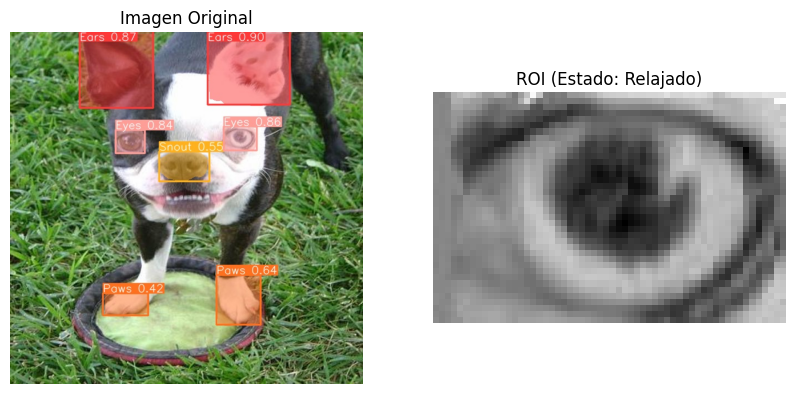

Estado del perro basado en el ojo: Relajado


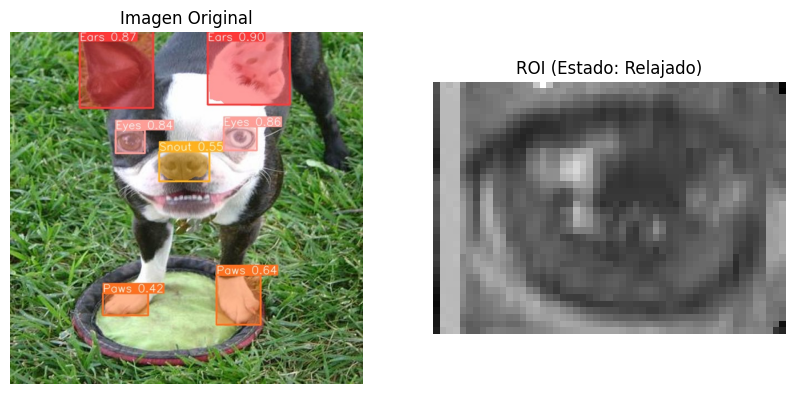

Estado del perro basado en el ojo: Relajado


In [ ]:
import os
from IPython.display import display
import ultralytics
from ultralytics import YOLO
import glob
import json
from PIL import Image, ImageDraw
import math
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt

def analyze_eye(image_path, bounding_box):
    """
    Analiza una imagen de un ojo para determinar si el perro está nervioso o relajado.

    Args:
        image_path: Ruta a la imagen del ojo.
        bounding_box: Coordenadas de la bounding box del ojo en formato [x1, y1, w, h].

    Returns:
        Una cadena que indica si el perro está "Nervioso" o "Relajado".
    """

    image = Image.open(image_path)
    x1, y1, w, h = bounding_box
    eye_image = image.crop((x1, y1, x1 + w, y1 + h))

    # Convertir la imagen a escala de grises
    eye_image_gray = eye_image.convert('L')

    # Calcular el histograma de la imagen en escala de grises
    histogram = eye_image_gray.histogram()

    # Calcular la proporción de píxeles negros
    black_pixels = histogram[0]  # El primer valor del histograma corresponde a los píxeles negros
    total_pixels = sum(histogram)
    black_pixel_ratio = black_pixels / total_pixels

    # Calcular el tamaño relativo de la pupila
    pupil_area = math.pi * (w / 2) * (h / 2)
    eye_area = w * h
    pupil_size_ratio = pupil_area / eye_area

    # Determinar el estado del perro basado en los ratios
    if black_pixel_ratio > 0.01 and pupil_size_ratio > 0.01:
        emotion = "Nervioso"
    else:
        emotion = "Relajado"

    # Mostrar la imagen original y la imagen en escala de grises con la ROI resaltada
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(image)
    draw = ImageDraw.Draw(image)
    draw.rectangle([(x1, y1), (x1 + w, y1 + h)], outline="red", width=2)
    axes[0].set_title("Imagen Original")
    axes[0].axis("off")

    axes[1].imshow(eye_image_gray, cmap="gray")
    axes[1].set_title(f"ROI (Estado: {emotion})")
    axes[1].axis("off")

    plt.show()

    return emotion

# Ejemplo de uso
image_path = f'{HOME}/runs/segment/predict/n02096585_2419_jpg.rf.3c856d049485a6f213f0b3f56ba9a8d9.jpg'  # Reemplaza con la ruta de tu imagen
bounding_boxes = [[386,175,58.027,38.4], [189,182,52.907,38.4]]  # Ojo derecho, ojo izquierdo

for box in bounding_boxes:
    estado = analyze_eye(image_path, box)
    print(f"Estado del perro basado en el ojo: {estado}")


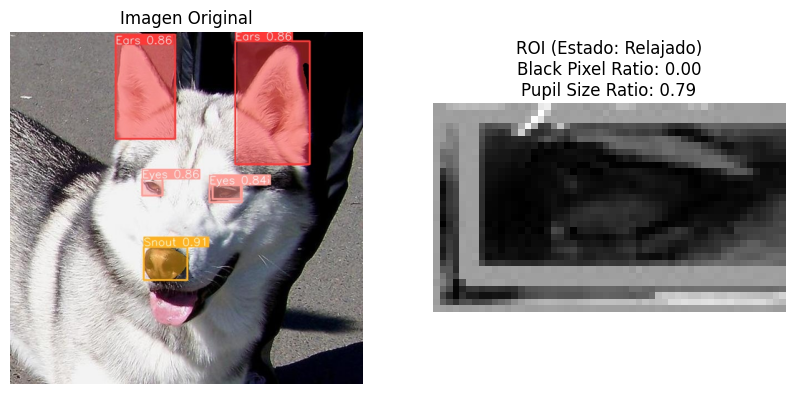

Black Pixel Ratio: 0.00
Pupil Size Ratio: 0.79
Estado del perro basado en el ojo: Relajado
Estado del perro basado en el ojo: Relajado


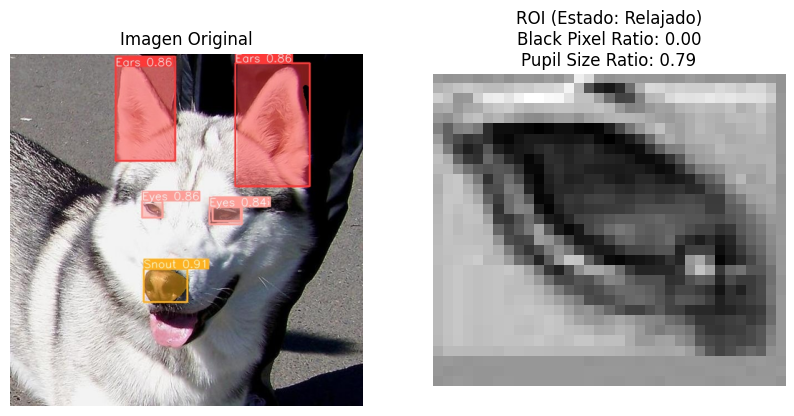

Black Pixel Ratio: 0.00
Pupil Size Ratio: 0.79
Estado del perro basado en el ojo: Relajado
Estado del perro basado en el ojo: Relajado


In [ ]:
import os
from IPython.display import display
import ultralytics
from ultralytics import YOLO
import glob
import json
from PIL import Image, ImageDraw
import math
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt

def analyze_eye(image_path, bounding_box):
    """
    Analiza una imagen de un ojo para determinar si el perro está nervioso o relajado.

    Args:
        image_path: Ruta a la imagen del ojo.
        bounding_box: Coordenadas de la bounding box del ojo en formato [x1, y1, w, h].

    Returns:
        Una cadena que indica si el perro está "Nervioso" o "Relajado".
    """

    image = Image.open(image_path)
    x1, y1, w, h = bounding_box
    eye_image = image.crop((x1, y1, x1 + w, y1 + h))

    # Convertir la imagen a escala de grises
    eye_image_gray = eye_image.convert('L')

    # Calcular el histograma de la imagen en escala de grises
    histogram = eye_image_gray.histogram()

    # Calcular la proporción de píxeles negros
    black_pixels = histogram[0]  # El primer valor del histograma corresponde a los píxeles negros
    total_pixels = sum(histogram)
    black_pixel_ratio = black_pixels / total_pixels

    # Calcular el tamaño relativo de la pupila
    pupil_area = math.pi * (w / 2) * (h / 2)
    eye_area = w * h
    pupil_size_ratio = pupil_area / eye_area

    # Determinar el estado del perro basado en los ratios
    if black_pixel_ratio > 0.01 and pupil_size_ratio > 0.01:
        emotion = "Nervioso"
    else:
        emotion = "Relajado"

    # Mostrar la imagen original y la imagen en escala de grises con la ROI resaltada
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(image)
    draw = ImageDraw.Draw(image)
    draw.rectangle([(x1, y1), (x1 + w, y1 + h)], outline="red", width=2)
    axes[0].set_title("Imagen Original")
    axes[0].axis("off")

    axes[1].imshow(eye_image_gray, cmap="gray")
    title = (f"ROI (Estado: {emotion})\n"
             f"Black Pixel Ratio: {black_pixel_ratio:.2f}\n"
             f"Pupil Size Ratio: {pupil_size_ratio:.2f}")
    axes[1].set_title(title)
    axes[1].axis("off")

    plt.show()

    # Imprimir los valores calculados
    print(f"Black Pixel Ratio: {black_pixel_ratio:.2f}")
    print(f"Pupil Size Ratio: {pupil_size_ratio:.2f}")
    print(f"Estado del perro basado en el ojo: {emotion}")

    return emotion

# Ejemplo de uso
image_path = f'{HOME}/runs/segment/predict/n02110185_3328_jpg.rf.3107ff38fa0f09dda42675a21e3e95fc.jpg'  # Reemplaza con la ruta de tu imagen
bounding_boxes = [[362,278,53.76,32], [241,269,34.56,30.72]]  # Ojo derecho, ojo izquierdo

for box in bounding_boxes:
    estado = analyze_eye(image_path, box)
    print(f"Estado del perro basado en el ojo: {estado}")


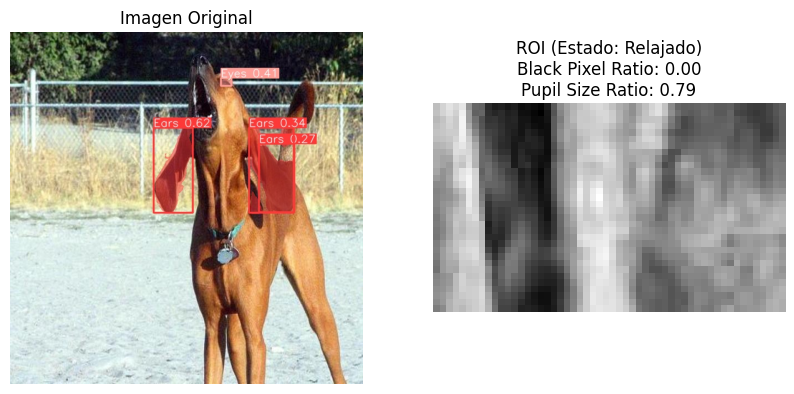

Black Pixel Ratio: 0.00
Pupil Size Ratio: 0.79
Estado del perro basado en el ojo: Relajado
Estado del perro basado en el ojo: Relajado


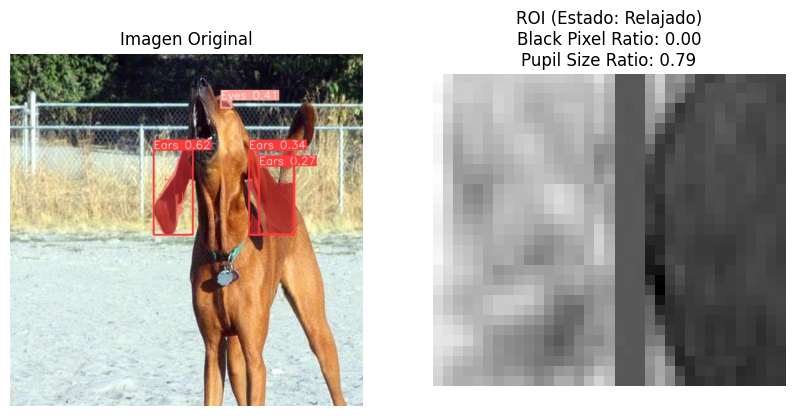

Black Pixel Ratio: 0.00
Pupil Size Ratio: 0.79
Estado del perro basado en el ojo: Relajado
Estado del perro basado en el ojo: Relajado


In [ ]:

#PERRO CON OREJA HACIA ABAJO, MIRANDO RECTO Y COLA HACIA ABAJO = TRANQUILO
#PERRO MIRANDO HACIA UN LADO, OREJA HACIA ARRIBA Y COLA ARRIBA = INTRANQUILO
#PERRO MIRANDO HACIA UN LADO, OREJA HACIA ABAJO Y COLA HACIA ARRIBA = JUGUETON
#PERRO CON HOCICO HACIA ARRIBA ANTES QUE LOS OJOS, ENFADADO
import os
from IPython.display import display
import ultralytics
from ultralytics import YOLO
import glob
import json
from PIL import Image, ImageDraw
import math
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt

def analyze_eye(image_path, bounding_box):
    """
    Analiza una imagen de un ojo para determinar si el perro está nervioso o relajado.

    Args:
        image_path: Ruta a la imagen del ojo.
        bounding_box: Coordenadas de la bounding box del ojo en formato [x1, y1, w, h].

    Returns:
        Una cadena que indica si el perro está "Nervioso" o "Relajado".
    """

    image = Image.open(image_path)
    x1, y1, w, h = bounding_box
    eye_image = image.crop((x1, y1, x1 + w, y1 + h))

    # Convertir la imagen a escala de grises
    eye_image_gray = eye_image.convert('L')

    # Calcular el histograma de la imagen en escala de grises
    histogram = eye_image_gray.histogram()

    # Calcular la proporción de píxeles negros
    black_pixels = histogram[0]  # El primer valor del histograma corresponde a los píxeles negros
    total_pixels = sum(histogram)
    black_pixel_ratio = black_pixels / total_pixels

    # Calcular el tamaño relativo de la pupila
    pupil_area = math.pi * (w / 2) * (h / 2)
    eye_area = w * h
    pupil_size_ratio = pupil_area / eye_area

    # Determinar el estado del perro basado en los ratios
    if black_pixel_ratio > 0.01 and pupil_size_ratio > 0.01:
        emotion = "Nervioso"
    else:
        emotion = "Relajado"

    # Mostrar la imagen original y la imagen en escala de grises con la ROI resaltada
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(image)
    draw = ImageDraw.Draw(image)
    draw.rectangle([(x1, y1), (x1 + w, y1 + h)], outline="red", width=2)
    axes[0].set_title("Imagen Original")
    axes[0].axis("off")

    axes[1].imshow(eye_image_gray, cmap="gray")
    title = (f"ROI (Estado: {emotion})\n"
             f"Black Pixel Ratio: {black_pixel_ratio:.2f}\n"
             f"Pupil Size Ratio: {pupil_size_ratio:.2f}")
    axes[1].set_title(title)
    axes[1].axis("off")

    plt.show()

    # Imprimir los valores calculados
    print(f"Black Pixel Ratio: {black_pixel_ratio:.2f}")
    print(f"Pupil Size Ratio: {pupil_size_ratio:.2f}")
    print(f"Estado del perro basado en el ojo: {emotion}")

    return emotion

# Ejemplo de uso
image_path = f'{HOME}/runs/segment/predict/n02090379_1292_jpg.rf.2bf6bab78ec1debfbd0b863abf3f39bc.jpg'  # Reemplaza con la ruta de tu imagen
bounding_boxes = [[483,86,70.4,177.506]]  # tail hacia arriba,

for box in bounding_boxes:
    estado = analyze_eye(image_path, box)
    print(f"Estado del perro basado en el ojo: {estado}")


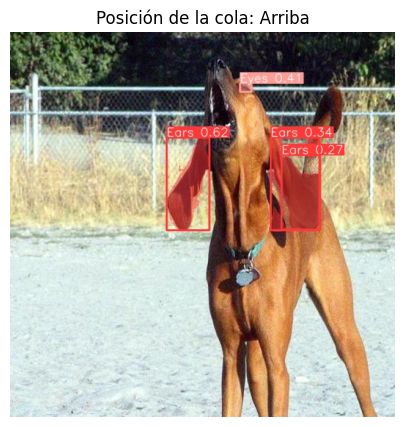

La cola del perro está: Arriba


In [ ]:
# prompt: Quiero que detecte si la cola del perro(tail) esta hacia arriba o hacia abajo en esta iamgen n02090379_1292_jpg.rf.2bf6bab78ec1debfbd0b863abf3f39bc.jpg, su bounding box es [483,86,70.4,177.506]

import os
from IPython import display
import ultralytics
from ultralytics import YOLO
from IPython.display import display, Image
from roboflow import Roboflow
from IPython.display import Image
import glob
from IPython.display import Image, display
import json
from PIL import Image, ImageDraw
import math
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display
import matplotlib.pyplot as plt

def analyze_tail(image_path, bounding_box):
    """
    Analiza la posición de la cola de un perro en una imagen.

    Args:
        image_path: Ruta a la imagen del perro.
        bounding_box: Coordenadas de la bounding box de la cola en formato [x1, y1, w, h].

    Returns:
        Una cadena que indica si la cola está "Arriba" o "Abajo".
    """

    image = Image.open(image_path)
    x1, y1, w, h = bounding_box

    # Calcular la posición del punto medio de la base de la cola
    base_midpoint = (x1 + w / 2, y1 + h)

    # Calcular la posición del punto medio de la punta de la cola
    tip_midpoint = (x1 + w / 2, y1)

    # Determinar si la cola está arriba o abajo
    if base_midpoint[1] > tip_midpoint[1]:
        tail_position = "Arriba"
    else:
        tail_position = "Abajo"

    # Mostrar la imagen con la bounding box y la posición de la cola
    fig, ax = plt.subplots(1, 1, figsize=(5, 5))
    ax.imshow(image)
    draw = ImageDraw.Draw(image)
    draw.rectangle([(x1, y1), (x1 + w, y1 + h)], outline="red", width=2)
    ax.set_title(f"Posición de la cola: {tail_position}")
    ax.axis("off")
    plt.show()

    return tail_position

# Ejemplo de uso
image_path = f'{HOME}/runs/segment/predict/n02090379_1292_jpg.rf.2bf6bab78ec1debfbd0b863abf3f39bc.jpg'
bounding_box = [483, 86, 70.4, 177.506]

tail_position = analyze_tail(image_path, bounding_box)
print(f"La cola del perro está: {tail_position}")


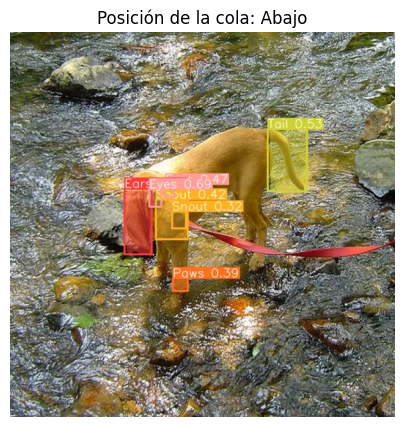

La cola del perro está: Abajo


In [ ]:

from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt

def analyze_tail(image_path, bounding_box):
    """
    Analiza la posición de la cola de un perro en una imagen utilizando la triangulación.

    Args:
        image_path: Ruta a la imagen del perro.
        bounding_box: Coordenadas de la bounding box de la cola en formato [x1, y1, w, h].

    Returns:
        Una cadena que indica si la cola está "Arriba" o "Abajo".
    """
    image = Image.open(image_path)
    x1, y1, w, h = bounding_box

    # Calcular el centroide de la bounding box
    centroid = (x1 + w / 2, y1 + h / 2)

    # Punto de referencia
    reference_point = (457.28, 213.074)

    # Determinar si la cola está arriba o abajo por triangulación
    if reference_point[1] > centroid[1]:
        tail_position = "Arriba"
    else:
        tail_position = "Abajo"

    # Mostrar la imagen con la bounding box, el centroide y el punto de referencia
    fig, ax = plt.subplots(1, 1, figsize=(5, 5))
    ax.imshow(image)
    draw = ImageDraw.Draw(image)
    draw.rectangle([(x1, y1), (x1 + w, y1 + h)], outline="yellow", width=2)

    # Marcar el centroide con una cruz
    draw.line((centroid[0] - 5, centroid[1], centroid[0] + 5, centroid[1]), fill="red", width=2)
    draw.line((centroid[0], centroid[1] - 5, centroid[0], centroid[1] + 5), fill="red", width=2)

    # Marcar el punto de referencia con un punto azul
    draw.ellipse((reference_point[0] - 5, reference_point[1] - 5, reference_point[0] + 5, reference_point[1] + 5), fill='blue')

    ax.set_title(f"Posición de la cola: {tail_position}")
    ax.axis("off")
    plt.show()

    return tail_position

# Ejemplo de uso
image_path = f'{HOME}/runs/segment/predict/n02088466_4445_jpg.rf.d3941d3d7c284721f5a848f15920d142.jpg'
bounding_box = [424, 159, 66.56, 108.148]

tail_position = analyze_tail(image_path, bounding_box)
print(f"La cola del perro está: {tail_position}")


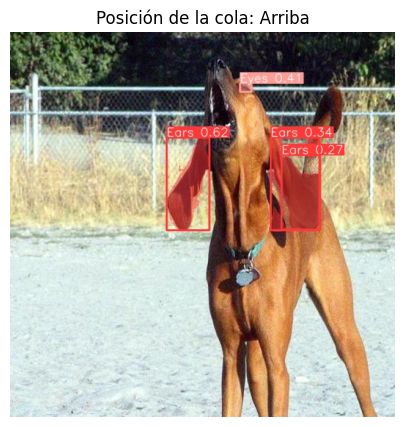

La cola del perro está: Arriba


In [ ]:
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt

def analyze_tail(image_path, bounding_box):
    """
    Analiza la posición de la cola de un perro en una imagen utilizando la triangulación.

    Args:
        image_path: Ruta a la imagen del perro.
        bounding_box: Coordenadas de la bounding box de la cola en formato [x1, y1, w, h].

    Returns:
        Una cadena que indica si la cola está "Arriba" o "Abajo".
    """
    image = Image.open(image_path)
    x1, y1, w, h = bounding_box

    # Calcular el centroide de la bounding box
    centroid = (x1 + w / 2, y1 + h / 2)

    # Punto de referencia
    reference_point = (457.28, 213.074)

    # Determinar si la cola está arriba o abajo por triangulación
    if reference_point[1] > centroid[1]:
        tail_position = "Arriba"
    else:
        tail_position = "Abajo"

    # Mostrar la imagen con la bounding box, el centroide y el punto de referencia
    fig, ax = plt.subplots(1, 1, figsize=(5, 5))
    ax.imshow(image)
    draw = ImageDraw.Draw(image)
    draw.rectangle([(x1, y1), (x1 + w, y1 + h)], outline="yellow", width=2)

    # Marcar el centroide con una cruz
    draw.line((centroid[0] - 5, centroid[1], centroid[0] + 5, centroid[1]), fill="red", width=2)
    draw.line((centroid[0], centroid[1] - 5, centroid[0], centroid[1] + 5), fill="red", width=2)

    # Marcar el punto de referencia con un punto azul
    draw.ellipse((reference_point[0] - 5, reference_point[1] - 5, reference_point[0] + 5, reference_point[1] + 5), fill='blue')

    ax.set_title(f"Posición de la cola: {tail_position}")
    ax.axis("off")
    plt.show()

    return tail_position

# Ejemplo de uso
image_path = f'{HOME}/runs/segment/predict/n02090379_1292_jpg.rf.2bf6bab78ec1debfbd0b863abf3f39bc.jpg'
bounding_box = [483, 86, 70.4, 177.506]

tail_position = analyze_tail(image_path, bounding_box)
print(f"La cola del perro está: {tail_position}")

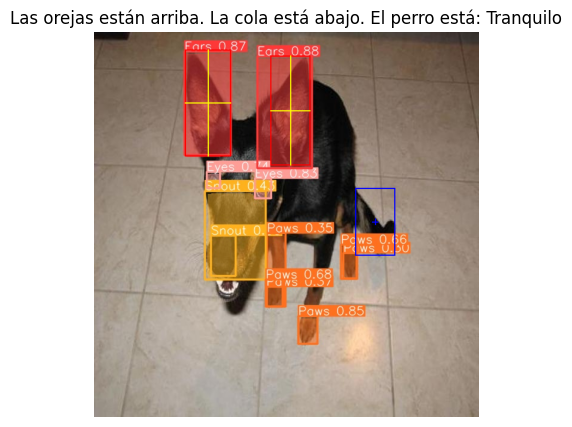

Las orejas están arriba. La cola está abajo. El perro está: Tranquilo


In [ ]:
#PERRO CON OREJA HACIA ABAJO, MIRANDO RECTO Y COLA HACIA ABAJO = TRANQUILO
#PERRO MIRANDO HACIA UN LADO, OREJA HACIA ARRIBA Y COLA ARRIBA = INTRANQUILO
#PERRO MIRANDO HACIA UN LADO, OREJA HACIA ABAJO Y COLA HACIA ARRIBA = JUGUETON
#PERRO CON HOCICO HACIA ARRIBA ANTES QUE LOS OJOS, ENFADADO
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt

def analyze_dog_parts(image_path, ear_boxes, tail_box):
    """
    Analiza la posición de las orejas y la cola de un perro en una imagen.

    Args:
        image_path: Ruta a la imagen del perro.
        ear_boxes: Lista de coordenadas de las bounding boxes de las orejas en formato [x1, y1, w, h].
        tail_box: Coordenadas de la bounding box de la cola en formato [x1, y1, w, h].

    Returns:
        Una cadena que indica el estado del perro: "Tranquilo", "Intranquilo", "Juguetón" o "Enfadado".
    """
    image = Image.open(image_path)
    draw = ImageDraw.Draw(image)

    ear_centroids = []
    for x1, y1, w, h in ear_boxes:
        centroid = (x1 + w / 2, y1 + h / 2)
        ear_centroids.append(centroid)
        draw.rectangle([(x1, y1), (x1 + w, y1 + h)], outline="red", width=2)
        draw.line((centroid[0] - 5, centroid[1], centroid[0] + 5, centroid[1]), fill="yellow", width=2)
        draw.line((centroid[0], centroid[1] - 5, centroid[0], centroid[1] + 5), fill="yellow", width=2)
        draw.line((x1, y1 + h / 2, x1 + w, y1 + h / 2), fill="yellow", width=2)  # Línea horizontal en la caja
        draw.line((x1 + w / 2, y1, x1 + w / 2, y1 + h), fill="yellow", width=2)  # Línea vertical en la caja

    x1, y1, w, h = tail_box
    tail_centroid = (x1 + w / 2, y1 + h / 2)
    draw.rectangle([(x1, y1), (x1 + w, y1 + h)], outline="blue", width=2)
    draw.line((tail_centroid[0] - 5, tail_centroid[1], tail_centroid[0] + 5, tail_centroid[1]), fill="blue", width=2)
    draw.line((tail_centroid[0], tail_centroid[1] - 5, tail_centroid[0], tail_centroid[1] + 5), fill="blue", width=2)

    # Determinar si las orejas están arriba o abajo (comparando con la parte superior de la bounding box)
    ears_up = all([centroid[1] < (y1 + h / 2) for centroid in ear_centroids])

    # Determinar si la cola está arriba o abajo
    tail_up = tail_centroid[1] < (y1 + h / 2)  # Comparar con el centro vertical de la bounding box de la cola

    # Determinar el estado del perro
    if ears_up and not tail_up:
        estado = "Tranquilo"
    elif not ears_up and tail_up:
        estado = "Intranquilo"
    elif not ears_up and not tail_up:
        estado = "Juguetón"
    else:
        estado = "Enfadado"

    # Posiciones detalladas de orejas y cola
    orejas_pos = "arriba" if ears_up else "abajo"
    cola_pos = "arriba" if tail_up else "abajo"

    # Mensaje final
    mensaje_final = f"Las orejas están {orejas_pos}. La cola está {cola_pos}. El perro está: {estado}"

    # Mostrar la imagen con las bounding boxes y centroides
    fig, ax = plt.subplots(1, 1, figsize=(5, 5))
    ax.imshow(image)
    ax.set_title(mensaje_final)
    ax.axis("off")
    plt.show()

    return mensaje_final

# Ejemplo de uso
image_path = f'{HOME}/runs/segment/predict/n02105412_1757_jpg.rf.3929bd4770fbc418e18e85df62e80454.jpg'
ear_boxes = [[151, 29, 76.8, 177.493], [293, 39, 66.56, 182.613]]
tail_box = [434, 259, 66.56, 112.64]

estado = analyze_dog_parts(image_path, ear_boxes, tail_box)
print(estado)


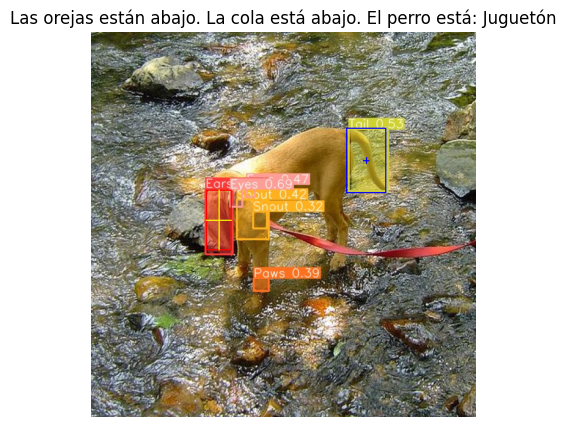

Las orejas están abajo. La cola está abajo. El perro está: Juguetón


In [ ]:
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt

def analyze_dog_parts(image_path, ear_boxes, tail_box):
    """
    Analiza la posición de las orejas y la cola de un perro en una imagen.

    Args:
        image_path: Ruta a la imagen del perro.
        ear_boxes: Lista de coordenadas de las bounding boxes de las orejas en formato [x1, y1, w, h].
        tail_box: Coordenadas de la bounding box de la cola en formato [x1, y1, w, h].

    Returns:
        Una cadena que indica el estado del perro: "Tranquilo", "Intranquilo", "Juguetón" o "Enfadado".
    """
    image = Image.open(image_path)
    draw = ImageDraw.Draw(image)

    ear_centroids = []
    for x1, y1, w, h in ear_boxes:
        centroid = (x1 + w / 2, y1 + h / 2)
        ear_centroids.append(centroid)
        draw.rectangle([(x1, y1), (x1 + w, y1 + h)], outline="red", width=2)
        draw.line((centroid[0] - 5, centroid[1], centroid[0] + 5, centroid[1]), fill="yellow", width=2)
        draw.line((centroid[0], centroid[1] - 5, centroid[0], centroid[1] + 5), fill="yellow", width=2)
        draw.line((x1, y1 + h / 2, x1 + w, y1 + h / 2), fill="yellow", width=2)  # Línea horizontal en la caja
        draw.line((x1 + w / 2, y1, x1 + w / 2, y1 + h), fill="yellow", width=2)  # Línea vertical en la caja

    x1, y1, w, h = tail_box
    tail_centroid = (x1 + w / 2, y1 + h / 2)
    draw.rectangle([(x1, y1), (x1 + w, y1 + h)], outline="blue", width=2)
    draw.line((tail_centroid[0] - 5, tail_centroid[1], tail_centroid[0] + 5, tail_centroid[1]), fill="blue", width=2)
    draw.line((tail_centroid[0], tail_centroid[1] - 5, tail_centroid[0], tail_centroid[1] + 5), fill="blue", width=2)

    # Determinar si las orejas están arriba o abajo (comparando con la parte superior de la bounding box)
    ears_up = all([centroid[1] < (y1 + h / 2) for centroid in ear_centroids])

    # Determinar si la cola está arriba o abajo
    tail_up = tail_centroid[1] < (y1 + h / 2)  # Comparar con el centro vertical de la bounding box de la cola

    # Determinar el estado del perro
    if ears_up and not tail_up:
        estado = "Tranquilo"
    elif not ears_up and tail_up:
        estado = "Intranquilo"
    elif not ears_up and not tail_up:
        estado = "Juguetón"
    else:
        estado = "Enfadado"

    # Posiciones detalladas de orejas y cola
    orejas_pos = "arriba" if ears_up else "abajo"
    cola_pos = "arriba" if tail_up else "abajo"

    # Mensaje final
    mensaje_final = f"Las orejas están {orejas_pos}. La cola está {cola_pos}. El perro está: {estado}"

    # Mostrar la imagen con las bounding boxes y centroides
    fig, ax = plt.subplots(1, 1, figsize=(5, 5))
    ax.imshow(image)
    ax.set_title(mensaje_final)
    ax.axis("off")
    plt.show()

    return mensaje_final

# Ejemplo de uso
image_path = f'{HOME}/runs/segment/predict/n02088466_4445_jpg.rf.d3941d3d7c284721f5a848f15920d142.jpg'
ear_boxes = [[191, 262, 42.5, 100.55]]
tail_box = [424, 159, 66.56, 108.148]

estado = analyze_dog_parts(image_path, ear_boxes, tail_box)
print(estado)


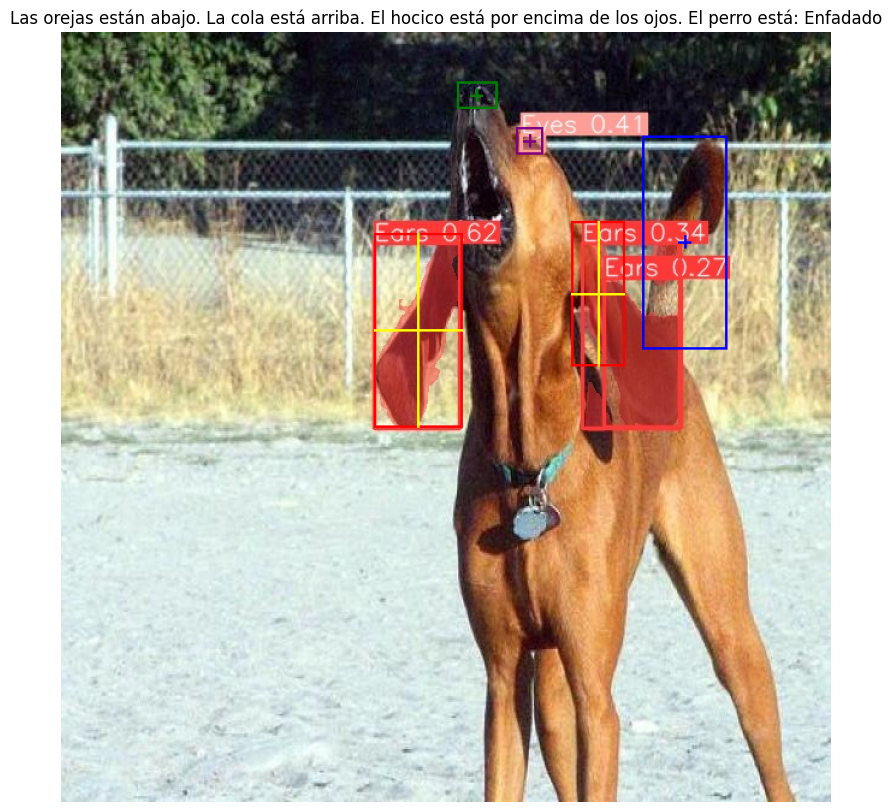

Las orejas están abajo. La cola está arriba. El hocico está por encima de los ojos. El perro está: Enfadado


In [ ]:
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt

def analyze_tail(image, bounding_box):
    """
    Analiza la posición de la cola de un perro en una imagen utilizando la triangulación.

    Args:
        image: Objeto PIL.Image de la imagen del perro.
        bounding_box: Coordenadas de la bounding box de la cola en formato [x1, y1, w, h].

    Returns:
        Una cadena que indica si la cola está "Arriba" o "Abajo".
    """
    x1, y1, w, h = bounding_box

    # Calcular el centroide de la bounding box
    centroid = (x1 + w / 2, y1 + h / 2)

    # Punto de referencia
    reference_point = (457.28, 213.074)

    # Determinar si la cola está arriba o abajo por triangulación
    if reference_point[1] > centroid[1]:
        tail_position = "Arriba"
    else:
        tail_position = "Abajo"

    return tail_position, centroid, reference_point

def analyze_dog_parts(image_path, ear_boxes, tail_box, snout_box, eye_box):
    """
    Analiza la posición de las orejas, la cola, el hocico y los ojos de un perro en una imagen.

    Args:
        image_path: Ruta a la imagen del perro.
        ear_boxes: Lista de coordenadas de las bounding boxes de las orejas en formato [x1, y1, w, h].
        tail_box: Coordenadas de la bounding box de la cola en formato [x1, y1, w, h].
        snout_box: Coordenadas de la bounding box del hocico en formato [x1, y1, w, h].
        eye_box: Coordenadas de la bounding box de los ojos en formato [x1, y1, w, h].

    Returns:
        Una cadena que indica el estado del perro.
    """
    image = Image.open(image_path)
    draw = ImageDraw.Draw(image)

    # Procesar las orejas
    ear_centroids = []
    for x1, y1, w, h in ear_boxes:
        centroid = (x1 + w / 2, y1 + h / 2)
        ear_centroids.append(centroid)
        draw.rectangle([(x1, y1), (x1 + w, y1 + h)], outline="red", width=2)
        draw.line((centroid[0] - 5, centroid[1], centroid[0] + 5, centroid[1]), fill="yellow", width=2)
        draw.line((centroid[0], centroid[1] - 5, centroid[0], centroid[1] + 5), fill="yellow", width=2)
        draw.line((x1, y1 + h / 2, x1 + w, y1 + h / 2), fill="yellow", width=2)  # Línea horizontal en la caja
        draw.line((x1 + w / 2, y1, x1 + w / 2, y1 + h), fill="yellow", width=2)  # Línea vertical en la caja

    # Procesar la cola
    tail_position, tail_centroid, reference_point = analyze_tail(image, tail_box)
    draw.rectangle([(tail_box[0], tail_box[1]), (tail_box[0] + tail_box[2], tail_box[1] + tail_box[3])], outline="blue", width=2)
    draw.line((tail_centroid[0] - 5, tail_centroid[1], tail_centroid[0] + 5, tail_centroid[1]), fill="blue", width=2)
    draw.line((tail_centroid[0], tail_centroid[1] - 5, tail_centroid[0], tail_centroid[1] + 5), fill="blue", width=2)


    # Procesar el hocico
    x1, y1, w, h = snout_box
    snout_centroid = (x1 + w / 2, y1 + h / 2)
    draw.rectangle([(x1, y1), (x1 + w, y1 + h)], outline="green", width=2)
    draw.line((snout_centroid[0] - 5, snout_centroid[1], snout_centroid[0] + 5, snout_centroid[1]), fill="green", width=2)
    draw.line((snout_centroid[0], snout_centroid[1] - 5, snout_centroid[0], snout_centroid[1] + 5), fill="green", width=2)

    # Procesar los ojos
    x1, y1, w, h = eye_box
    eye_centroid = (x1 + w / 2, y1 + h / 2)
    draw.rectangle([(x1, y1), (x1 + w, y1 + h)], outline="purple", width=2)
    draw.line((eye_centroid[0] - 5, eye_centroid[1], eye_centroid[0] + 5, eye_centroid[1]), fill="purple", width=2)
    draw.line((eye_centroid[0], eye_centroid[1] - 5, eye_centroid[0], eye_centroid[1] + 5), fill="purple", width=2)

    # Calcular el promedio de las posiciones Y de las orejas para determinar su posición relativa
    ear_avg_y = sum([centroid[1] for centroid in ear_centroids]) / len(ear_centroids)

    # Determinar si las orejas están arriba o abajo (relativo a su posición promedio)
    ears_up = all([centroid[1] < ear_avg_y for centroid in ear_centroids])

    # Determinar si el hocico está por encima de los ojos
    snout_above_eyes = snout_centroid[1] < eye_centroid[1]

    # Determinar el estado del perro
    if tail_position == "Arriba" and snout_above_eyes:
        estado = "Enfadado"
    elif ears_up and tail_position == "Abajo":
        estado = "Tranquilo"
    elif not ears_up and tail_position == "Arriba":
        estado = "Intranquilo"
    elif not ears_up and tail_position == "Abajo":
        estado = "Juguetón"
    else:
        estado = "Indeterminado"

    # Posiciones detalladas de orejas, cola y hocico
    orejas_pos = "arriba" if ears_up else "abajo"
    cola_pos = tail_position.lower()
    snout_pos = "por encima de los ojos" if snout_above_eyes else "por debajo de los ojos"

    # Mensaje final
    mensaje_final = f"Las orejas están {orejas_pos}. La cola está {cola_pos}. El hocico está {snout_pos}. El perro está: {estado}"

    # Mostrar la imagen con las bounding boxes y centroides
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    ax.imshow(image)
    ax.set_title(mensaje_final)
    ax.axis("off")
    plt.show()

    return mensaje_final

# Ejemplo de uso
image_path = f'{HOME}/runs/segment/predict/n02090379_1292_jpg.rf.2bf6bab78ec1debfbd0b863abf3f39bc.jpg'
ear_boxes = [[260,167,73.75,161.419], [424,157,44.375,120.07]]
tail_box = [483, 86, 70.4, 177.506]
snout_box = [329, 41, 33.125, 22.265]
eye_box = [378, 79, 22.125, 22.265]  # Ajuste: un poco más a la derecha y un poco más alto

estado = analyze_dog_parts(image_path, ear_boxes, tail_box, snout_box, eye_box)
print(estado)


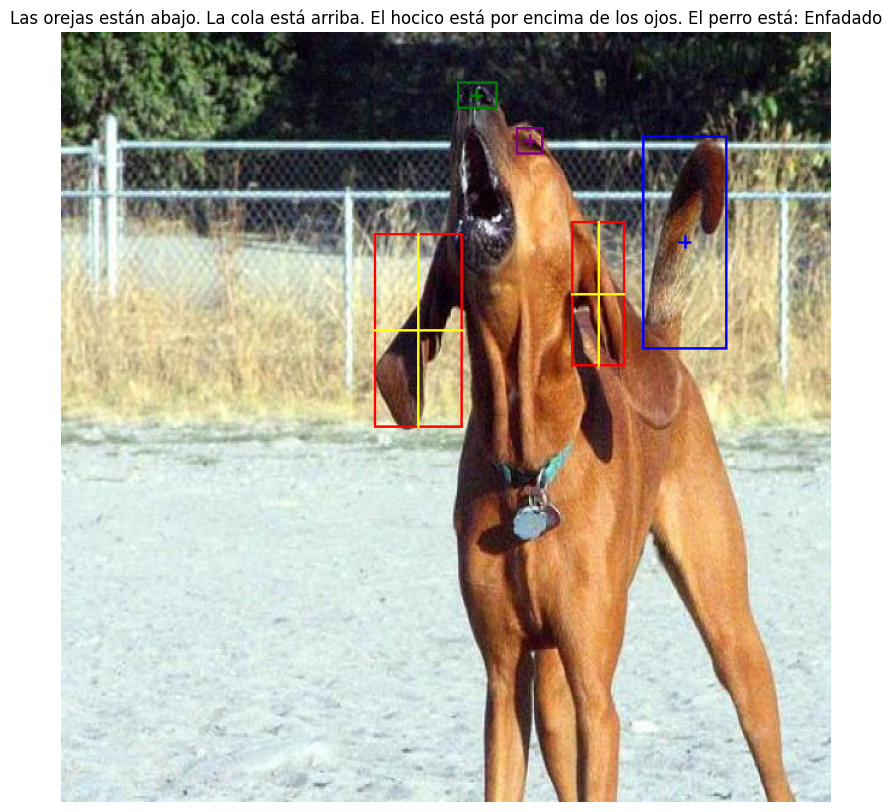

Las orejas están abajo. La cola está arriba. El hocico está por encima de los ojos. El perro está: Enfadado


In [ ]:
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt

def analyze_tail(image, bounding_box):
    """
    Analiza la posición de la cola de un perro en una imagen utilizando la triangulación.

    Args:
        image: Objeto PIL.Image de la imagen del perro.
        bounding_box: Coordenadas de la bounding box de la cola en formato [x1, y1, w, h].

    Returns:
        Una cadena que indica si la cola está "Arriba" o "Abajo".
    """
    x1, y1, w, h = bounding_box

    # Calcular el centroide de la bounding box
    centroid = (x1 + w / 2, y1 + h / 2)

    # Punto de referencia
    reference_point = (457.28, 213.074)

    # Determinar si la cola está arriba o abajo por triangulación
    if reference_point[1] > centroid[1]:
        tail_position = "Arriba"
    else:
        tail_position = "Abajo"

    return tail_position, centroid, reference_point

def analyze_dog_parts(image_path, ear_boxes, tail_box, snout_box, eye_box):
    """
    Analiza la posición de las orejas, la cola, el hocico y los ojos de un perro en una imagen.

    Args:
        image_path: Ruta a la imagen del perro.
        ear_boxes: Lista de coordenadas de las bounding boxes de las orejas en formato [x1, y1, w, h].
        tail_box: Coordenadas de la bounding box de la cola en formato [x1, y1, w, h].
        snout_box: Coordenadas de la bounding box del hocico en formato [x1, y1, w, h].
        eye_box: Coordenadas de la bounding box de los ojos en formato [x1, y1, w, h].

    Returns:
        Una cadena que indica el estado del perro.
    """
    image = Image.open(image_path)
    draw = ImageDraw.Draw(image)

    # Procesar las orejas
    ear_centroids = []
    for x1, y1, w, h in ear_boxes:
        centroid = (x1 + w / 2, y1 + h / 2)
        ear_centroids.append(centroid)
        draw.rectangle([(x1, y1), (x1 + w, y1 + h)], outline="red", width=2)
        draw.line((centroid[0] - 5, centroid[1], centroid[0] + 5, centroid[1]), fill="yellow", width=2)
        draw.line((centroid[0], centroid[1] - 5, centroid[0], centroid[1] + 5), fill="yellow", width=2)
        draw.line((x1, y1 + h / 2, x1 + w, y1 + h / 2), fill="yellow", width=2)  # Línea horizontal en la caja
        draw.line((x1 + w / 2, y1, x1 + w / 2, y1 + h), fill="yellow", width=2)  # Línea vertical en la caja

    # Procesar la cola
    tail_position, tail_centroid, reference_point = analyze_tail(image, tail_box)
    draw.rectangle([(tail_box[0], tail_box[1]), (tail_box[0] + tail_box[2], tail_box[1] + tail_box[3])], outline="blue", width=2)
    draw.line((tail_centroid[0] - 5, tail_centroid[1], tail_centroid[0] + 5, tail_centroid[1]), fill="blue", width=2)
    draw.line((tail_centroid[0], tail_centroid[1] - 5, tail_centroid[0], tail_centroid[1] + 5), fill="blue", width=2)


    # Procesar el hocico
    x1, y1, w, h = snout_box
    snout_centroid = (x1 + w / 2, y1 + h / 2)
    draw.rectangle([(x1, y1), (x1 + w, y1 + h)], outline="green", width=2)
    draw.line((snout_centroid[0] - 5, snout_centroid[1], snout_centroid[0] + 5, snout_centroid[1]), fill="green", width=2)
    draw.line((snout_centroid[0], snout_centroid[1] - 5, snout_centroid[0], snout_centroid[1] + 5), fill="green", width=2)

    # Procesar los ojos
    x1, y1, w, h = eye_box
    eye_centroid = (x1 + w / 2, y1 + h / 2)
    draw.rectangle([(x1, y1), (x1 + w, y1 + h)], outline="purple", width=2)
    draw.line((eye_centroid[0] - 5, eye_centroid[1], eye_centroid[0] + 5, eye_centroid[1]), fill="purple", width=2)
    draw.line((eye_centroid[0], eye_centroid[1] - 5, eye_centroid[0], eye_centroid[1] + 5), fill="purple", width=2)

    # Calcular el promedio de las posiciones Y de las orejas para determinar su posición relativa
    ear_avg_y = sum([centroid[1] for centroid in ear_centroids]) / len(ear_centroids)

    # Determinar si las orejas están arriba o abajo (relativo a su posición promedio)
    ears_up = all([centroid[1] < ear_avg_y for centroid in ear_centroids])

    # Determinar si el hocico está por encima de los ojos
    snout_above_eyes = snout_centroid[1] < eye_centroid[1]

    # Determinar el estado del perro
    if tail_position == "Arriba" and snout_above_eyes:
        estado = "Enfadado"
    elif ears_up and tail_position == "Abajo":
        estado = "Tranquilo"
    elif not ears_up and tail_position == "Arriba":
        estado = "Intranquilo"
    elif not ears_up and tail_position == "Abajo":
        estado = "Juguetón"
    else:
        estado = "Indeterminado"

    # Posiciones detalladas de orejas, cola y hocico
    orejas_pos = "arriba" if ears_up else "abajo"
    cola_pos = tail_position.lower()
    snout_pos = "por encima de los ojos" if snout_above_eyes else "por debajo de los ojos"

    # Mensaje final
    mensaje_final = f"Las orejas están {orejas_pos}. La cola está {cola_pos}. El hocico está {snout_pos}. El perro está: {estado}"

    # Mostrar la imagen con las bounding boxes y centroides
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    ax.imshow(image)
    ax.set_title(mensaje_final)
    ax.axis("off")
    plt.show()

    return mensaje_final

# Ejemplo de uso
image_path = f'{HOME}/datasets/Dog-Segmentation-1/test/images/n02090379_1292_jpg.rf.2bf6bab78ec1debfbd0b863abf3f39bc.jpg'
ear_boxes = [[260,167,73.75,161.419], [424,157,44.375,120.07]]
tail_box = [483, 86, 70.4, 177.506]
snout_box = [329, 41, 33.125, 22.265]
eye_box = [378, 79, 22.125, 22.265]  # Ajuste: un poco más a la derecha y un poco más alto

estado = analyze_dog_parts(image_path, ear_boxes, tail_box, snout_box, eye_box)
print(estado)